In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [8]:
# Đọc dữ liệu từng năm 2022 2023 2024
df_2022 = pd.read_csv('diem2022.csv')
df_2023 = pd.read_csv('diem2023.csv')
df_2024 = pd.read_csv('diem2024.csv')

In [9]:
# Nối dữ liệu 3 năm thành 1 Dataframe tổng
df_all = pd.concat([df_2024,df_2023,df_2022], ignore_index=True)
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3079106 entries, 0 to 3079105
Data columns (total 17 columns):
 #   Column     Dtype  
---  ------     -----  
 0   sbd        int64  
 1   toan       float64
 2   ngu_van    float64
 3   ngoai_ngu  float64
 4   vat_li     float64
 5   hoa_hoc    float64
 6   sinh_hoc   float64
 7   lich_su    float64
 8   dia_li     float64
 9   gdcd       float64
 10  a00        float64
 11  a01        float64
 12  b00        float64
 13  d00        float64
 14  c00        float64
 15  tinh_thi   object 
 16  nam_thi    int64  
dtypes: float64(14), int64(2), object(1)
memory usage: 399.4+ MB


# OverView về số lượng thí sinh dự thi và điểm thi:

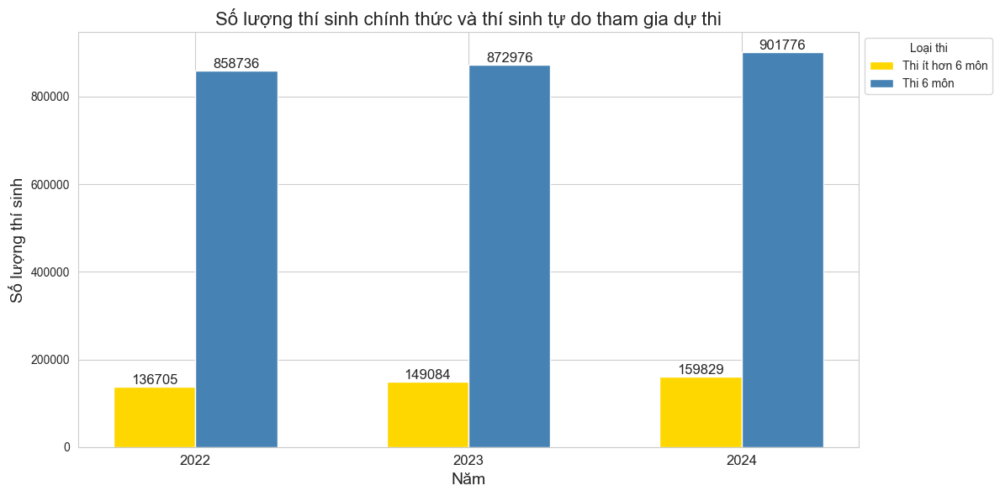

In [4]:
# Xử lý dữ liệu
not_null_2022 = df_2022[['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']].notna().sum(axis=1)
df_not_null_2022 = pd.DataFrame({
    'Số môn thi' : not_null_2022.value_counts().index,
    'Số lượng' : not_null_2022.value_counts().values,
})
df1 = pd.DataFrame({
    'Số môn thi': [' Thi 6 môn', ' Thi ít hơn 6 môn'],
    'Số lượng': [
        df_not_null_2022[df_not_null_2022['Số môn thi'] == 6]['Số lượng'].sum(),
        df_not_null_2022[df_not_null_2022['Số môn thi'] < 6]['Số lượng'].sum()
    ]
})

not_null_2023 = df_2023[['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']].notna().sum(axis=1)
df_not_null_2023 = pd.DataFrame({
    'Số môn thi' : not_null_2023.value_counts().index,
    'Số lượng' : not_null_2023.value_counts().values,
})
df2 = pd.DataFrame({
    'Số môn thi': [' Thi 6 môn', ' Thi ít hơn 6 môn'],
    'Số lượng': [
        df_not_null_2023[df_not_null_2023['Số môn thi'] == 6]['Số lượng'].sum(),
        df_not_null_2023[df_not_null_2023['Số môn thi'] < 6]['Số lượng'].sum()
    ]
})

not_null_2024 = df_2024[['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']].notna().sum(axis=1)
df_not_null_2024 = pd.DataFrame({
    'Số môn thi' : not_null_2024.value_counts().index,
    'Số lượng' : not_null_2024.value_counts().values,
})
df3 = pd.DataFrame({
    'Số môn thi': [' Thi 6 môn', ' Thi ít hơn 6 môn'],
    'Số lượng': [
        df_not_null_2024[df_not_null_2024['Số môn thi'] == 6]['Số lượng'].sum(),
        df_not_null_2024[df_not_null_2024['Số môn thi'] < 6]['Số lượng'].sum()
    ]
})

# Vẽ biểu đồ
df_bar = pd.DataFrame({
    'Năm': ['2022', '2023', '2024'],
    'Thi 6 môn': [df1['Số lượng'][0], df2['Số lượng'][0], df3['Số lượng'][0]],
    'Thi ít hơn 6 môn': [df1['Số lượng'][1], df2['Số lượng'][1], df3['Số lượng'][1]]
})

x = np.arange(len(df_bar['Năm']))
w = 0.3
fig, ax = plt.subplots(figsize=(12, 6))

bar1 = ax.bar(x - w/2, df_bar['Thi ít hơn 6 môn'], w, label='Thi ít hơn 6 môn', color='#FFD700')
bar2 = ax.bar(x + w/2, df_bar['Thi 6 môn'], w, label='Thi 6 môn', color='#4682B4')

ax.set_title("Số lượng thí sinh chính thức và thí sinh tự do tham gia dự thi", fontsize=16)
ax.set_xlabel("Năm", fontsize=14)
ax.set_ylabel("Số lượng thí sinh", fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(df_bar['Năm'], fontsize=12)
ax.legend(title='Loại thi', bbox_to_anchor=(1, 1), loc='upper left')

for bar_group in [bar1, bar2]:
    for bar in bar_group:
        res = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            res,
            f'{int(res)}',
            ha='center',
            va='bottom',
            fontsize=12
        )

plt.tight_layout()
plt.show()

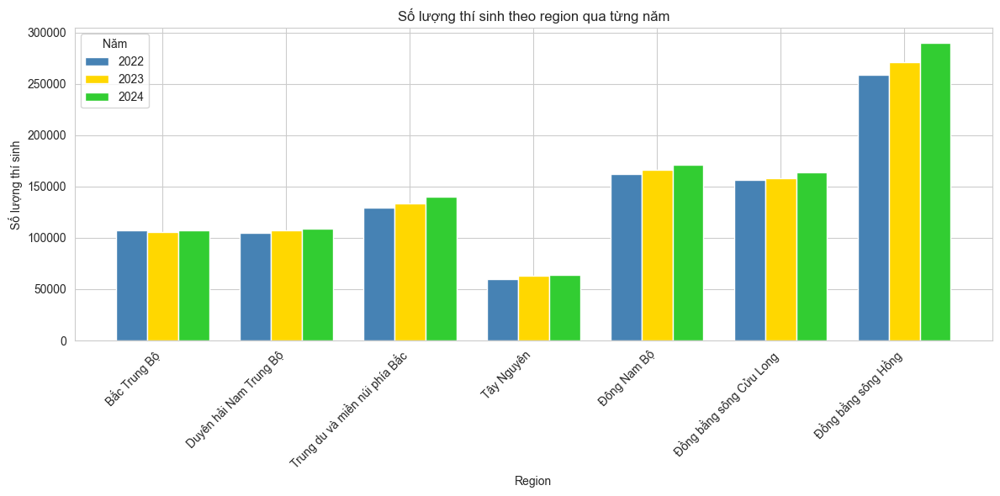

In [5]:
khu_vuc = {
    'Hà Nội': 'Đồng bằng sông Hồng',
    'TP. Hồ Chí Minh': 'Đông Nam Bộ',
    'Đà Nẵng': 'Duyên hải Nam Trung Bộ',
    'Cần Thơ': 'Đồng bằng sông Cửu Long',
    'Hải Phòng': 'Đồng bằng sông Hồng',
    'An Giang': 'Đồng bằng sông Cửu Long',
    'Bà Rịa - Vũng Tàu': 'Đông Nam Bộ',
    'Bắc Giang': 'Trung du và miền núi phía Bắc',
    'Bắc Kạn': 'Trung du và miền núi phía Bắc',
    'Bạc Liêu': 'Đồng bằng sông Cửu Long',
    'Bắc Ninh': 'Đồng bằng sông Hồng',
    'Bến Tre': 'Đồng bằng sông Cửu Long',
    'Bình Định': 'Duyên hải Nam Trung Bộ',
    'Bình Dương': 'Đông Nam Bộ',
    'Bình Phước': 'Đông Nam Bộ',
    'Bình Thuận': 'Duyên hải Nam Trung Bộ',
    'Cà Mau': 'Đồng bằng sông Cửu Long',
    'Cao Bằng': 'Trung du và miền núi phía Bắc',
    'Đăk Lăk': 'Tây Nguyên',
    'Đăk Nông': 'Tây Nguyên',
    'Điện Biên': 'Trung du và miền núi phía Bắc',
    'Đồng Nai': 'Đông Nam Bộ',
    'Đồng Tháp': 'Đồng bằng sông Cửu Long',
    'Gia Lai': 'Tây Nguyên',
    'Hà Giang': 'Trung du và miền núi phía Bắc',
    'Hà Nam': 'Đồng bằng sông Hồng',
    'Hải Dương': 'Đồng bằng sông Hồng',
    'Hòa Bình': 'Trung du và miền núi phía Bắc',
    'Hậu Giang': 'Đồng bằng sông Cửu Long',
    'Hưng Yên': 'Đồng bằng sông Hồng',
    'Khánh Hòa': 'Duyên hải Nam Trung Bộ',
    'Kiên Giang': 'Đồng bằng sông Cửu Long',
    'Kon Tum': 'Tây Nguyên',
    'Lai Châu': 'Trung du và miền núi phía Bắc',
    'Lâm Đồng': 'Tây Nguyên',
    'Lạng Sơn': 'Trung du và miền núi phía Bắc',
    'Lào Cai': 'Trung du và miền núi phía Bắc',
    'Long An': 'Đồng bằng sông Cửu Long',
    'Nam Định': 'Đồng bằng sông Hồng',
    'Nghệ An': 'Bắc Trung Bộ',
    'Ninh Bình': 'Đồng bằng sông Hồng',
    'Ninh Thuận': 'Duyên hải Nam Trung Bộ',
    'Phú Thọ': 'Trung du và miền núi phía Bắc',
    'Phú Yên': 'Duyên hải Nam Trung Bộ',
    'Quảng Bình': 'Bắc Trung Bộ',
    'Quảng Nam': 'Duyên hải Nam Trung Bộ',
    'Quảng Ngãi': 'Duyên hải Nam Trung Bộ',
    'Quảng Ninh': 'Đồng bằng sông Hồng',
    'Quảng Trị': 'Bắc Trung Bộ',
    'Sóc Trăng': 'Đồng bằng sông Cửu Long',
    'Sơn La': 'Trung du và miền núi phía Bắc',
    'Tây Ninh': 'Đông Nam Bộ',
    'Thái Bình': 'Đồng bằng sông Hồng',
    'Thái Nguyên': 'Trung du và miền núi phía Bắc',
    'Thanh Hóa': 'Bắc Trung Bộ',
    'Thừa Thiên Huế': 'Bắc Trung Bộ',
    'Tiền Giang': 'Đồng bằng sông Cửu Long',
    'Trà Vinh': 'Đồng bằng sông Cửu Long',
    'Tuyên Quang': 'Trung du và miền núi phía Bắc',
    'Vĩnh Long': 'Đồng bằng sông Cửu Long',
    'Vĩnh Phúc': 'Đồng bằng sông Hồng',
    'Yên Bái': 'Trung du và miền núi phía Bắc'
}

df_region = pd.DataFrame({'tinh_thanh' : khu_vuc.keys(), 'mien' : khu_vuc.values()})

re_2022 = df_2022['tinh_thi'].value_counts()
re_2023 = df_2023['tinh_thi'].value_counts()
re_2024 = df_2024['tinh_thi'].value_counts()

df_re_2022 = pd.DataFrame({'tinh_thanh': re_2022.index, 'so_luong': re_2022.values})
df_re_2022 = df_re_2022.merge(df_region, on='tinh_thanh', how='inner')
df_re_2022 = df_re_2022.groupby('mien')['so_luong'].sum().reset_index()

df_re_2023 = pd.DataFrame({'tinh_thanh': re_2023.index, 'so_luong': re_2023.values})
df_re_2023 = df_re_2023.merge(df_region, on='tinh_thanh', how='inner')
df_re_2023 = df_re_2023.groupby('mien')['so_luong'].sum().reset_index()

df_re_2024 = pd.DataFrame({'tinh_thanh': re_2024.index, 'so_luong': re_2024.values})
df_re_2024 = df_re_2024.merge(df_region, on='tinh_thanh', how='inner')
df_re_2024 = df_re_2024.groupby('mien')['so_luong'].sum().reset_index()


x = np.arange(len(df_re_2024['mien']))
w = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - w, df_re_2022['so_luong'], w, label='2022', color='#4682B4')
ax.bar(x, df_re_2023['so_luong'], w, label='2023', color='#FFD700')
ax.bar(x + w, df_re_2024['so_luong'], w, label='2024', color='#32CD32')

# Add labels and title
ax.set_title("Số lượng thí sinh theo region qua từng năm")
ax.set_xlabel("Region")
ax.set_ylabel("Số lượng thí sinh")
ax.set_xticks(x)
ax.set_xticklabels(df_re_2024['mien'], rotation=45, ha='right')
ax.legend(title="Năm")

plt.tight_layout()
plt.show()


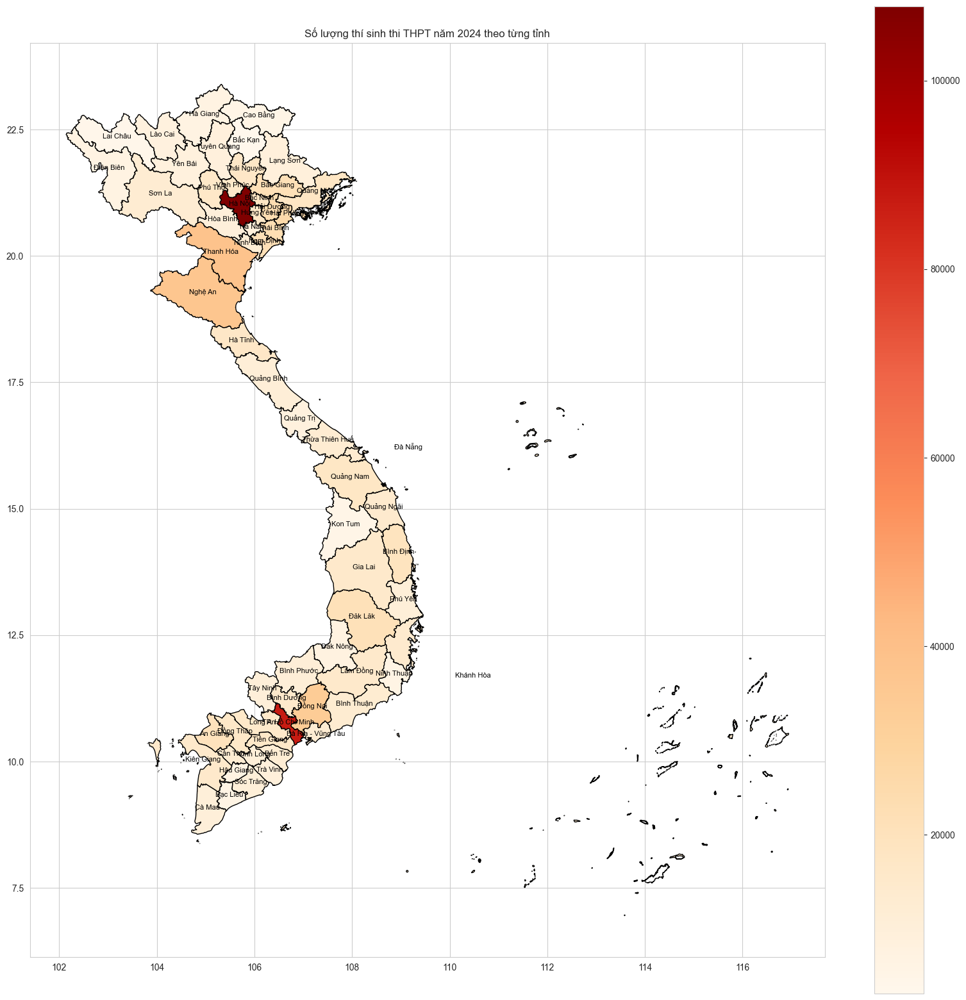

In [6]:
# Đọc dữ liệu
gdf = gpd.read_file('diaphantinh.geojson')
df_2024 = pd.read_csv('diem2024.csv')
soluong_2024 = df_2024['tinh_thi'].value_counts()
# Tạo DataFrame để vẽ biểu đồ
df_soluong2024 = pd.DataFrame({
    'Tỉnh thi': soluong_2024.index,
    'Số lượng': soluong_2024.values
})

# Kết nối cột 'Tỉnh thi' của dataframe với cột tên tỉnh trong biểu đồ geojson
g2024 = gdf.merge(df_soluong2024, left_on='ten_tinh', right_on='Tỉnh thi', how='inner')

# Vẽ biểu đồ
fig, ax = plt.subplots(figsize=(20, 20))
g2024.plot(column='Số lượng', ax=ax, cmap='OrRd', edgecolor='black', legend=True)

for idx, r in gdf.iterrows():
    x, y = r['geometry'].centroid.x, r['geometry'].centroid.y
    ax.text(x, y, r['ten_tinh'], fontsize=8, ha='center', color='black')

# Tùy chỉnh
ax.set_title('Số lượng thí sinh thi THPT năm 2024 theo từng tỉnh')
plt.show()

      Môn học  Điểm Tbinh   Năm
0        toan    6.466254  2022
1      vat_li    6.723779  2022
2     hoa_hoc    6.703898  2022
3   ngoai_ngu    5.157686  2022
4     ngu_van    6.507730  2022
5    sinh_hoc    5.019109  2022
6     lich_su    6.343930  2022
7      dia_li    6.677929  2022
8        gdcd    8.033266  2022
9        toan    6.250557  2023
10     vat_li    6.573900  2023
11    hoa_hoc    6.744646  2023
12  ngoai_ngu    5.462410  2023
13    ngu_van    6.858202  2023
14   sinh_hoc    6.394933  2023
15    lich_su    6.025629  2023
16     dia_li    6.147523  2023
17       gdcd    8.285805  2023
18       toan    6.447309  2024
19     vat_li    6.666866  2024
20    hoa_hoc    6.680830  2024
21  ngoai_ngu    5.521938  2024
22    ngu_van    7.231143  2024
23   sinh_hoc    6.284079  2024
24    lich_su    6.570343  2024
25     dia_li    7.193541  2024
26       gdcd    8.156503  2024


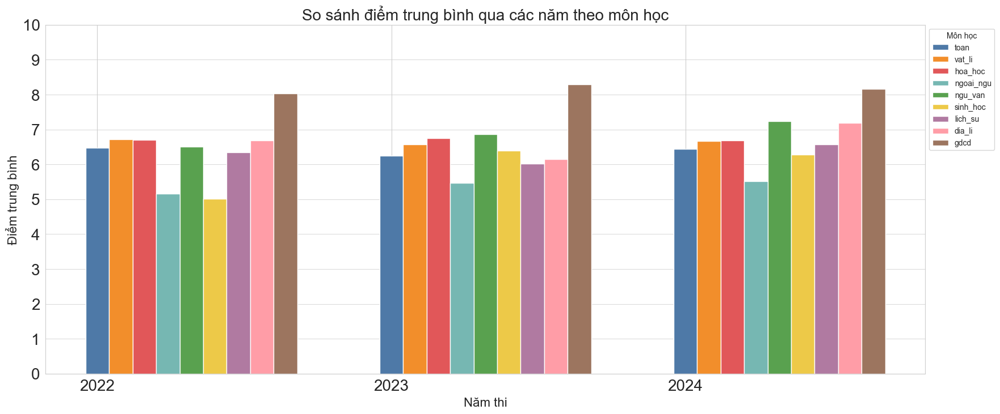

In [7]:
# OverView về điểm trung bình từng môn qua các năm
mon_hoc = ['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']
def diem_tb(df) :
    df_diemtb = df[mon_hoc].mean()
    return df_diemtb

tb_2022 = diem_tb(df_2022)
tb_2023 = diem_tb(df_2023)
tb_2024 = diem_tb(df_2024)
df_tb_2022 = pd.DataFrame({'Môn học' : tb_2022.index, 'Điểm Tbinh' : tb_2022.values, 'Năm' : 2022})
df_tb_2023 = pd.DataFrame({'Môn học' : tb_2023.index, 'Điểm Tbinh' : tb_2023.values, 'Năm' : 2023})
df_tb_2024 = pd.DataFrame({'Môn học' : tb_2024.index, 'Điểm Tbinh' : tb_2024.values, 'Năm' : 2024})

df_tb_all = pd.concat([df_tb_2022 , df_tb_2023 , df_tb_2024 ], ignore_index=True)
print(df_tb_all)

colors = [
    "#4E79A7",
    "#F28E2B",
    "#E15759",
    "#76B7B2",
    "#59A14F",
    "#EDC948",
    "#B07AA1",
    "#FF9DA7",
    "#9C755F"
]

plt.figure(figsize = (20,8))
for i,(s,color) in enumerate(zip(mon_hoc,colors)) :
    plt.bar(
        df_tb_all.loc[df_tb_all['Môn học'] == s, 'Năm'] + i * 0.08,
        df_tb_all.loc[df_tb_all['Môn học'] == s, 'Điểm Tbinh'],
        width = 0.08,
        label = s,
        color = color
    )
plt.xticks([2022,2023,2024], size = 20)
plt.yticks(np.arange(0,11), size = 20)
plt.xlabel('Năm thi', size = 16)
plt.ylabel('Điểm trung bình', size = 16)
plt.title('So sánh điểm trung bình qua các năm theo môn học', size = 20)
plt.legend(title='Môn học', bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.show()

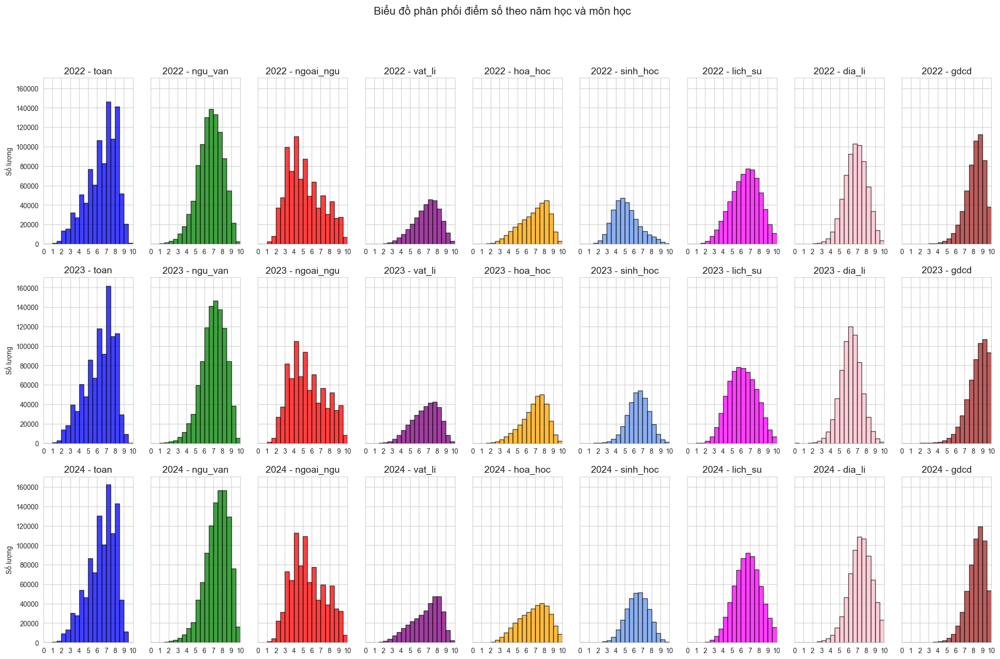

In [8]:
nam_hoc = [2022, 2023, 2024]
mon_hoc = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

mau_mon_hoc = {
    'toan': 'blue',
    'ngu_van': 'green',
    'ngoai_ngu': 'red',
    'vat_li': 'purple',
    'hoa_hoc': 'orange',
    'sinh_hoc': 'cornflowerblue',
    'lich_su': 'magenta',
    'dia_li': 'pink',
    'gdcd': 'brown'
}

fig, axes = plt.subplots(len(nam_hoc), len(mon_hoc), figsize=(25, 15), sharey=True)
fig.suptitle('Biểu đồ phân phối điểm số theo năm học và môn học', fontsize=16)

for i, nam in enumerate(nam_hoc):
    for j, mon in enumerate(mon_hoc):
        du_lieu_theo_nam = df_all[df_all['nam_thi'] == nam]
        diem_mon_hoc = du_lieu_theo_nam[mon]
        mau = mau_mon_hoc[mon]
        ax = axes[i, j]
        ax.hist(
            diem_mon_hoc,
            bins=20,
            range=(0, 10),
            alpha=0.75,
            color=mau,
            edgecolor='black'
        )

        ax.set_title(f"{nam} - {mon}", fontsize=14)
        ax.set_xlim(0, 10)
        ax.set_xticks(range(0, 11))
        if j == 0:
            ax.set_ylabel('Số lượng')

plt.show()


# Biểu đồ dạng cột về phổ điểm của từng Môn:

# Môn Toán

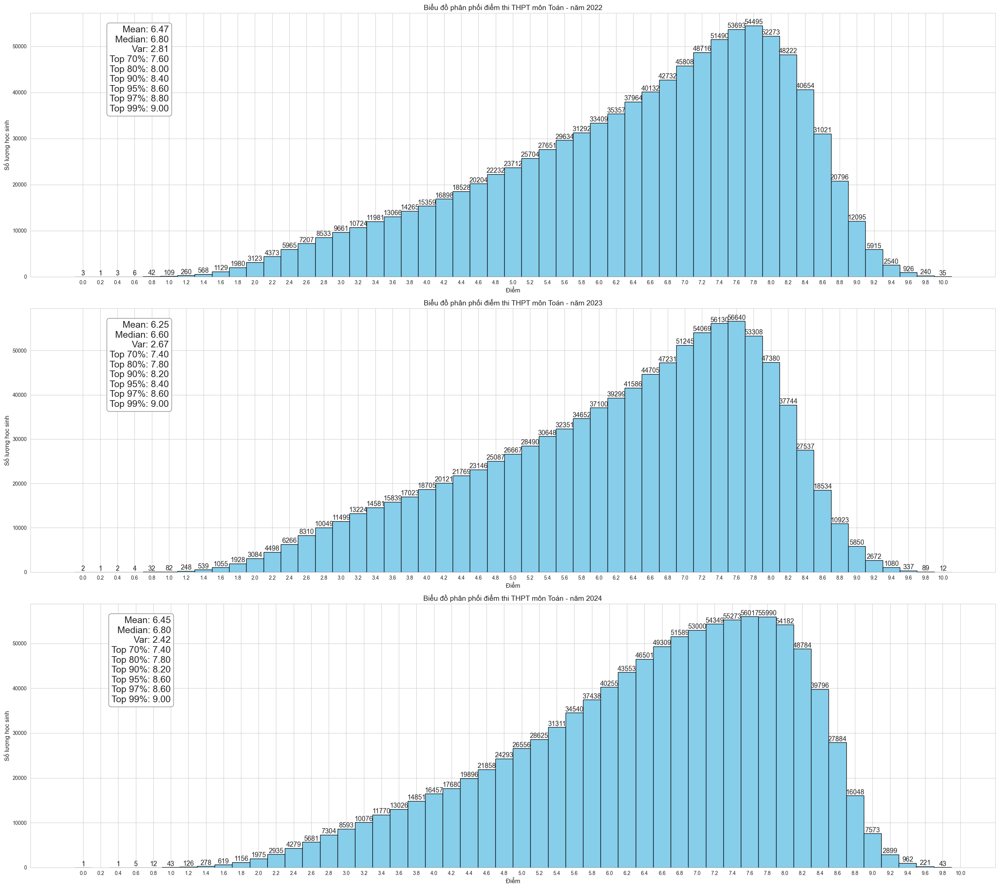

In [9]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    scores = df['toan'].dropna()
    a = scores.value_counts().sort_index()
    mean = scores.mean()
    median = scores.median()
    var = scores.var()
    percentiles = {
        f"Top {100 - p}%": np.percentile(scores, 100 - p) for p in [30, 20, 10, 5, 3, 1]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"Var: {var:.2f}\n"
        + "\n".join([f"{k}: {val:.2f}" for k, val in percentiles.items()])
    )

    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='skyblue', width=0.2)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Toán - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.2 for i in range(51)])

plt.tight_layout()
plt.show()


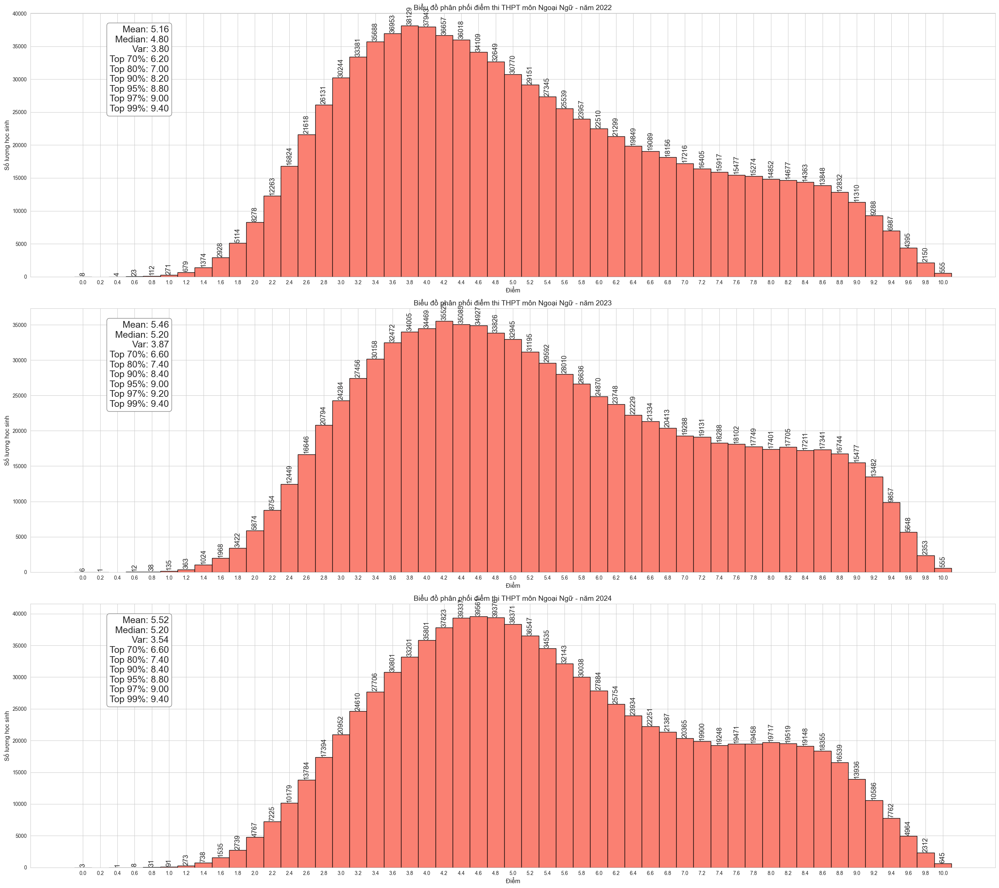

In [10]:
# Tạo danh sách các DataFrame và năm tương ứng
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    scores = df['ngoai_ngu'].dropna()
    a = scores.value_counts().sort_index()
    mean = scores.mean()
    median = scores.median()
    var = scores.var()
    percentiles = {
        f"Top {100 - p}%": np.percentile(scores, 100 - p) for p in [30, 20, 10, 5, 3, 1]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"Var: {var:.2f}\n"
        + "\n".join([f"{k}: {val:.2f}" for k, val in percentiles.items()])
    )

    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='salmon', width=0.2)

    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Ngoại Ngữ - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center',rotation=90, fontsize=13)
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )
    plt.xticks([i * 0.2 for i in range(51)])
plt.tight_layout()
plt.show()


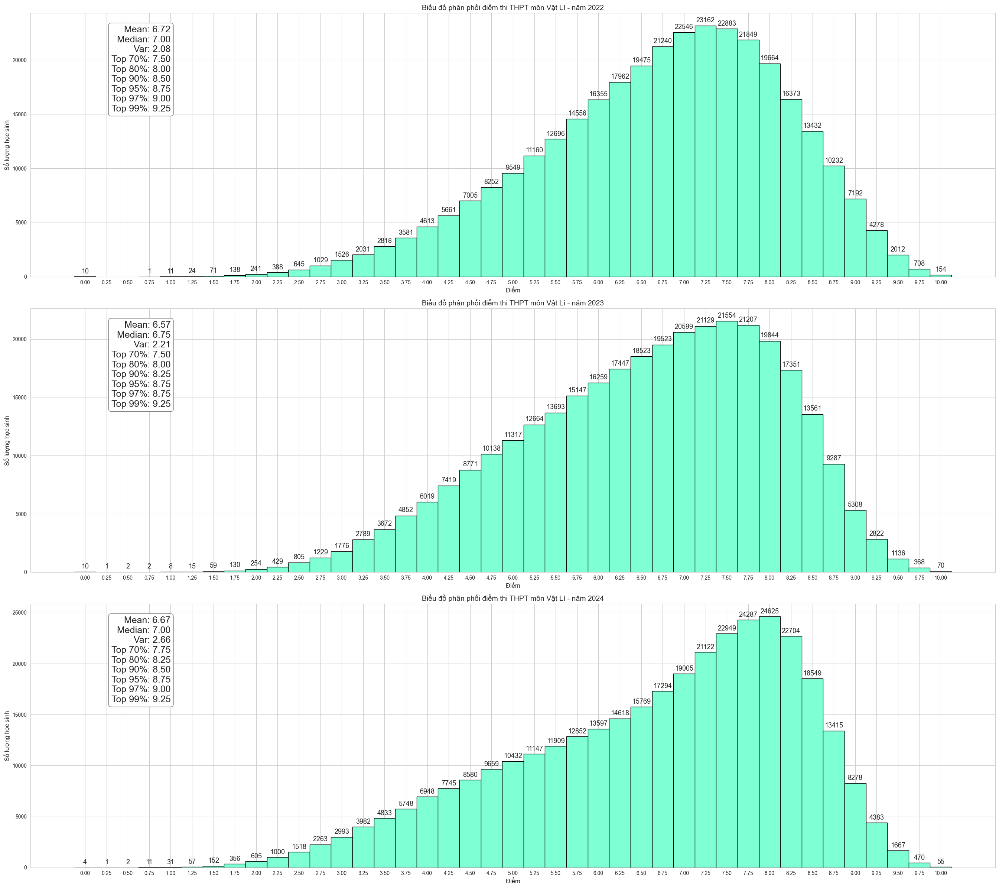

In [11]:
# Tạo danh sách các DataFrame và năm tương ứng
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]
plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):

    scores = df['vat_li'].dropna()

    a = scores.value_counts().sort_index()

    mean = scores.mean()
    median = scores.median()
    var = scores.var()

    percentiles = {
        f"Top {100 - p}%": np.percentile(scores, 100 - p) for p in [30, 20, 10, 5, 3, 1]
    }

    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"Var: {var:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )

    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='aquamarine', width=0.25)

    # Đặt tiêu đề và nhãn
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Vật Lí - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.25 for i in range(41)])

plt.tight_layout()
plt.show()


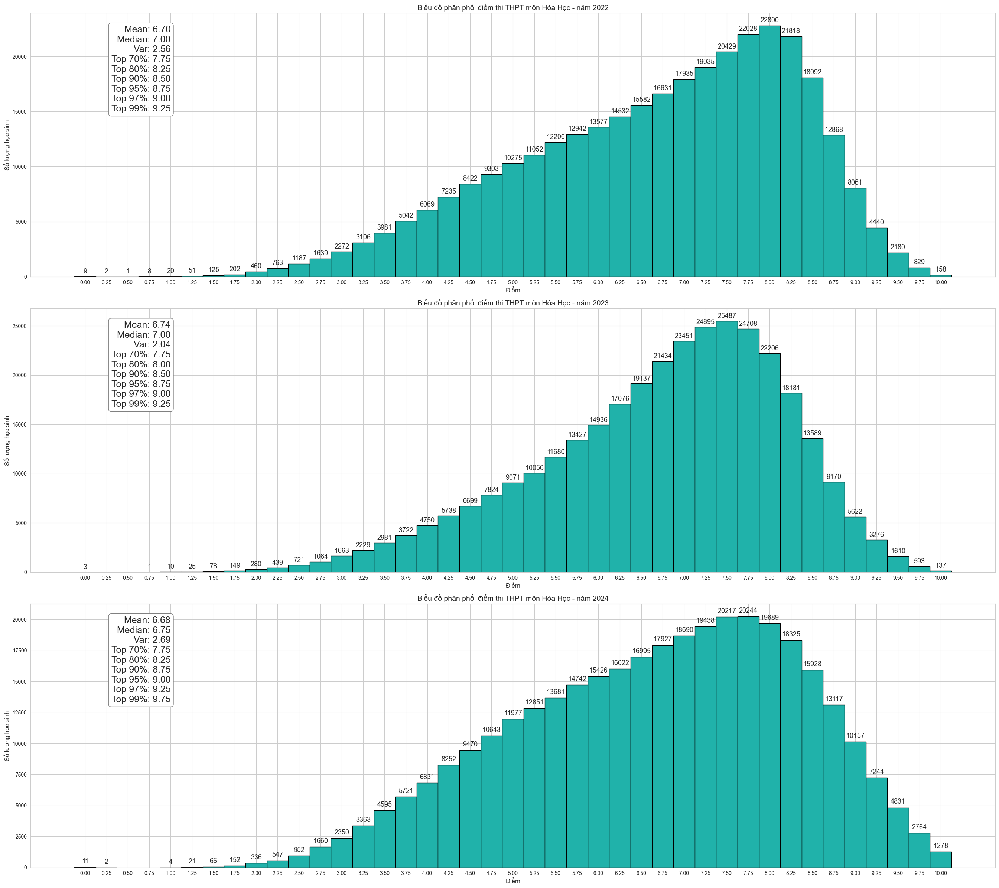

In [12]:
# Tạo danh sách các DataFrame và năm tương ứng
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

# Vẽ biểu đồ và tính toán các thống kê
plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    # Lọc bỏ các giá trị NaN (nếu có) trong cột 'toan'
    scores = df['hoa_hoc'].dropna()  # Đảm bảo không có giá trị NaN

    # Tính tần suất điểm
    a = scores.value_counts().sort_index()

    # Tính toán các thống kê
    mean = scores.mean()  # Điểm trung bình
    median = scores.median()  # Trung vị
    var = scores.var()  # Phương sai
    # Tính các mốc phân vị cho từng mức top
    percentiles = {
        f"Top {100 - p}%": np.percentile(scores, 100 - p) for p in [30, 20, 10, 5, 3, 1]
    }

    # Tạo thông tin để hiển thị
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"Var: {var:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )

    # Vẽ biểu đồ cột
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='lightseagreen', width=0.25)

    # Đặt tiêu đề và nhãn
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Hóa Học - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    # Thêm giá trị vào các thanh cột
    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    # Hiển thị các thống kê trên biểu đồ
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    # Đặt các mốc trên trục x
    plt.xticks([i * 0.25 for i in range(41)])

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


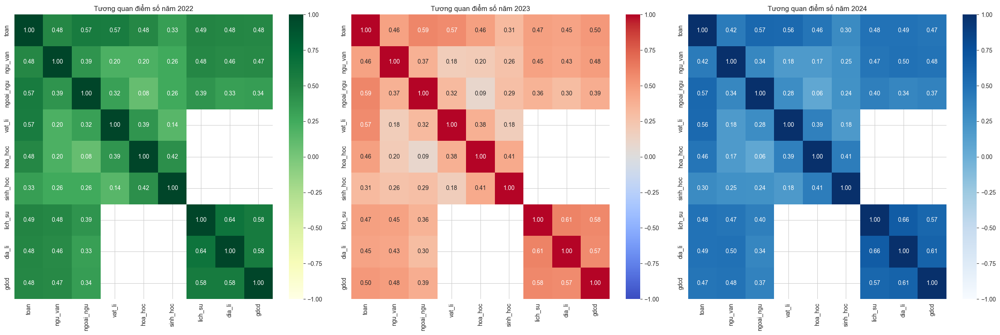

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8))  # 1 hàng, 3 cột, kích thước tổng

# Heatmap 1: Năm 2022
a_2022 = df_2022[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
s_matrix_2022 = a_2022.corr()
sns.heatmap(s_matrix_2022, annot=True, cmap='YlGn', fmt='.2f', vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title('Tương quan điểm số năm 2022')

# Heatmap 2: Năm 2023
a_2023 = df_2023[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
s_matrix_2023 = a_2023.corr()
sns.heatmap(s_matrix_2023, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title('Tương quan điểm số năm 2023')

# Heatmap 3: Năm 2024
a_2024 = df_2024[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
s_matrix_2024 = a_2024.corr()
sns.heatmap(s_matrix_2024, annot=True, cmap='Blues', fmt='.2f', vmin=-1, vmax=1, ax=axes[2])
axes[2].set_title('Tương quan điểm số năm 2024')

plt.tight_layout()  # Tự động căn chỉnh khoảng cách
plt.show()


# Biểu đồ dạng cột về phổ điểm của từng khối:

## Khối A00: Toán, Lý, Hóa

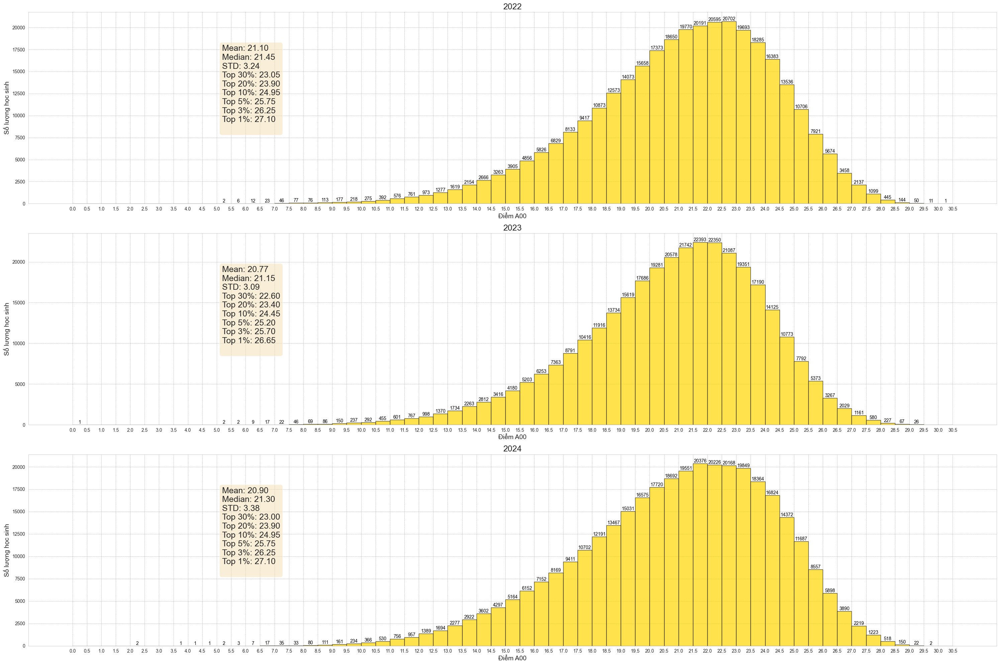

In [14]:
stats_2022 = df_2022['a00'].agg(['mean', 'median', 'var'])
stats_2023 = df_2023['a00'].agg(['mean', 'median', 'var'])
stats_2024 = df_2024['a00'].agg(['mean', 'median', 'var'])
percentiles_2022 = df_2022['a00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2023 = df_2023['a00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2024 = df_2024['a00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# bar charts using matplotlib:
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
statistics = [stats_2022, stats_2023, stats_2024]
percentiles_list = [percentiles_2022, percentiles_2023, percentiles_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, year in enumerate(years):
    df = data_frames[i]
    stats = statistics[i]
    percentiles = percentiles_list[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # plot distribution
    n, bins, patches = ax.hist(df['a00'], bins=np.arange(0, 31, 0.5), edgecolor='black', alpha=0.7, color='gold')
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Điểm A00', fontsize=14)
    ax.set_ylabel('Số lượng học sinh', fontsize=14)
    ax.set_xticks(np.arange(0, 31, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # num of students on bars
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}',
                    ha='center', va='bottom', fontsize=10, color='black')

    # legend
    textstr = (
        f"Mean: {stats['mean']:.2f}\n"
        f"Median: {stats['median']:.2f}\n"
        f"STD: {np.sqrt(stats['var']):.2f}\n"
    )
    for pct, score in percentiles.items():
        textstr += f"Top {int((1 - pct) * 100 + 0.00001)}%: {score:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, textstr, transform=ax.transAxes, fontsize=18,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.show()


## Khối A01: Toán, Lý, Anh

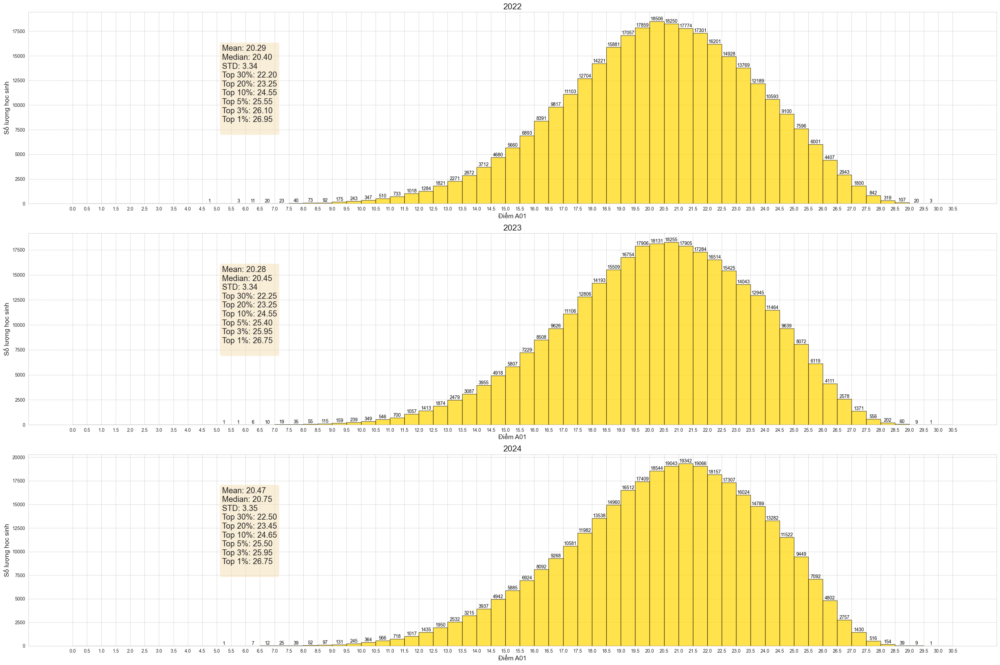

In [15]:
stats_2022 = df_2022['a01'].agg(['mean', 'median', 'var'])
stats_2023 = df_2023['a01'].agg(['mean', 'median', 'var'])
stats_2024 = df_2024['a01'].agg(['mean', 'median', 'var'])
percentiles_2022 = df_2022['a01'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2023 = df_2023['a01'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2024 = df_2024['a01'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# bar charts using matplotlib:
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
statistics = [stats_2022, stats_2023, stats_2024]
percentiles_list = [percentiles_2022, percentiles_2023, percentiles_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, year in enumerate(years):
    df = data_frames[i]
    stats = statistics[i]
    percentiles = percentiles_list[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # plot distribution
    n, bins, patches = ax.hist(df['a01'], bins=np.arange(0, 31, 0.5), edgecolor='black', alpha=0.7, color='gold')
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Điểm A01', fontsize=14)
    ax.set_ylabel('Số lượng học sinh', fontsize=14)
    ax.set_xticks(np.arange(0, 31, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # num of students on bars
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}', 
                    ha='center', va='bottom', fontsize=10, color='black')

    # legend
    textstr = (
        f"Mean: {stats['mean']:.2f}\n"
        f"Median: {stats['median']:.2f}\n"
        f"STD: {np.sqrt(stats['var']):.2f}\n"
    )
    for pct, score in percentiles.items():
        textstr += f"Top {int((1 - pct) * 100 + 0.00001)}%: {score:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, textstr, transform=ax.transAxes, fontsize=17,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.savefig('bar_a01.png', facecolor='white')
plt.show()


## Khối B00: Toán, Hóa, Sinh

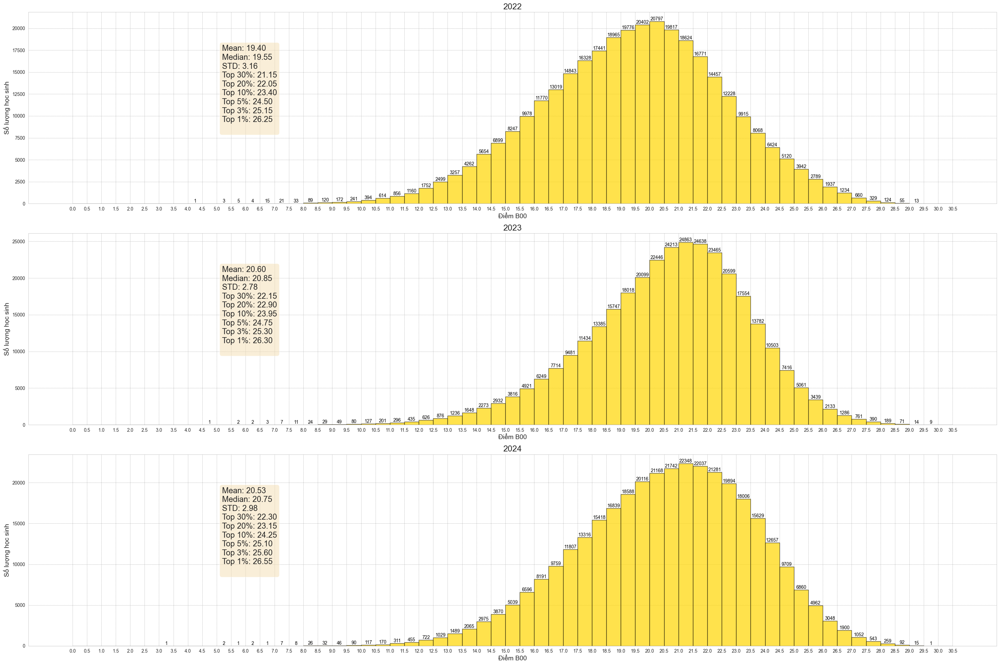

In [16]:
stats_2022 = df_2022['b00'].agg(['mean', 'median', 'var'])
stats_2023 = df_2023['b00'].agg(['mean', 'median', 'var'])
stats_2024 = df_2024['b00'].agg(['mean', 'median', 'var'])
percentiles_2022 = df_2022['b00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2023 = df_2023['b00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2024 = df_2024['b00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# bar charts using matplotlib:
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
statistics = [stats_2022, stats_2023, stats_2024]
percentiles_list = [percentiles_2022, percentiles_2023, percentiles_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, year in enumerate(years):
    df = data_frames[i]
    stats = statistics[i]
    percentiles = percentiles_list[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # plot distribution
    n, bins, patches = ax.hist(df['b00'], bins=np.arange(0, 31, 0.5), edgecolor='black', alpha=0.7, color='gold')
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Điểm B00', fontsize=14)
    ax.set_ylabel('Số lượng học sinh', fontsize=14)
    ax.set_xticks(np.arange(0, 31, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # num of students on bars
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}', 
                    ha='center', va='bottom', fontsize=10, color='black')

    # legend
    textstr = (
        f"Mean: {stats['mean']:.2f}\n"
        f"Median: {stats['median']:.2f}\n"
        f"STD: {np.sqrt(stats['var']):.2f}\n"
    )
    for pct, score in percentiles.items():
        textstr += f"Top {int((1 - pct) * 100 + 0.00001)}%: {score:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, textstr, transform=ax.transAxes, fontsize=17,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.savefig('bar_b00.png', facecolor='white')
plt.show()


## Khối C00: Văn, Sử, Địa

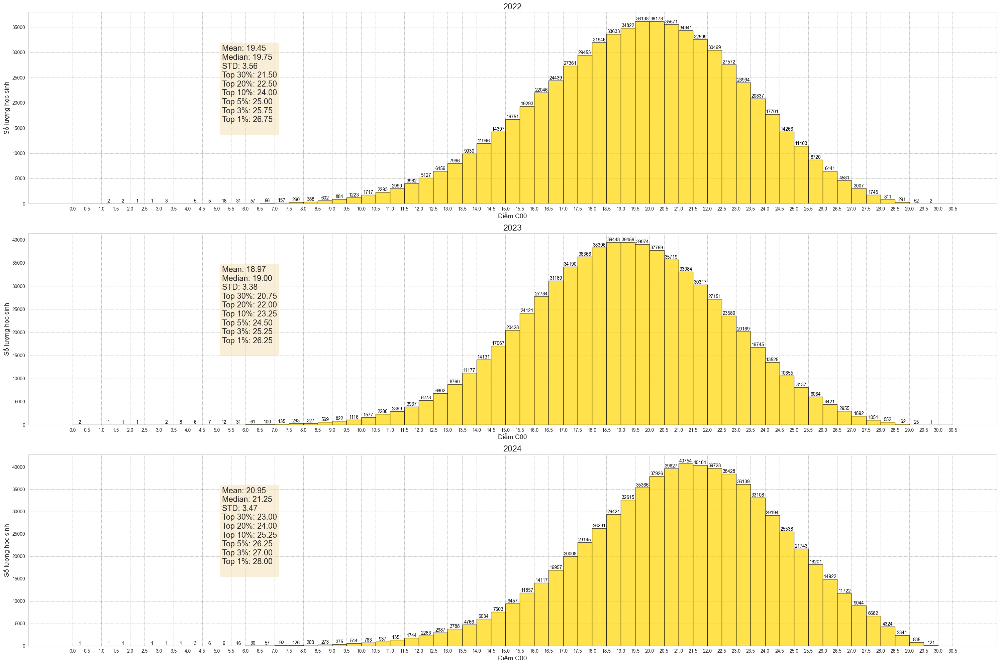

In [17]:
stats_2022 = df_2022['c00'].agg(['mean', 'median', 'var'])
stats_2023 = df_2023['c00'].agg(['mean', 'median', 'var'])
stats_2024 = df_2024['c00'].agg(['mean', 'median', 'var'])
percentiles_2022 = df_2022['c00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2023 = df_2023['c00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2024 = df_2024['c00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# bar charts using matplotlib:
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
statistics = [stats_2022, stats_2023, stats_2024]
percentiles_list = [percentiles_2022, percentiles_2023, percentiles_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, year in enumerate(years):
    df = data_frames[i]
    stats = statistics[i]
    percentiles = percentiles_list[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # plot distribution
    n, bins, patches = ax.hist(df['c00'], bins=np.arange(0, 31, 0.5), edgecolor='black', alpha=0.7, color='gold')
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Điểm C00', fontsize=14)
    ax.set_ylabel('Số lượng học sinh', fontsize=14)
    ax.set_xticks(np.arange(0, 31, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # num of students on bars
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}', 
                    ha='center', va='bottom', fontsize=10, color='black')

    # legend
    textstr = (
        f"Mean: {stats['mean']:.2f}\n"
        f"Median: {stats['median']:.2f}\n"
        f"STD: {np.sqrt(stats['var']):.2f}\n"
    )
    for pct, score in percentiles.items():
        textstr += f"Top {int((1 - pct) * 100 + 0.00001)}%: {score:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, textstr, transform=ax.transAxes, fontsize=17,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.savefig('bar_c00.png', facecolor='white')
plt.show()

## Khối D00: Toán, Văn, Anh

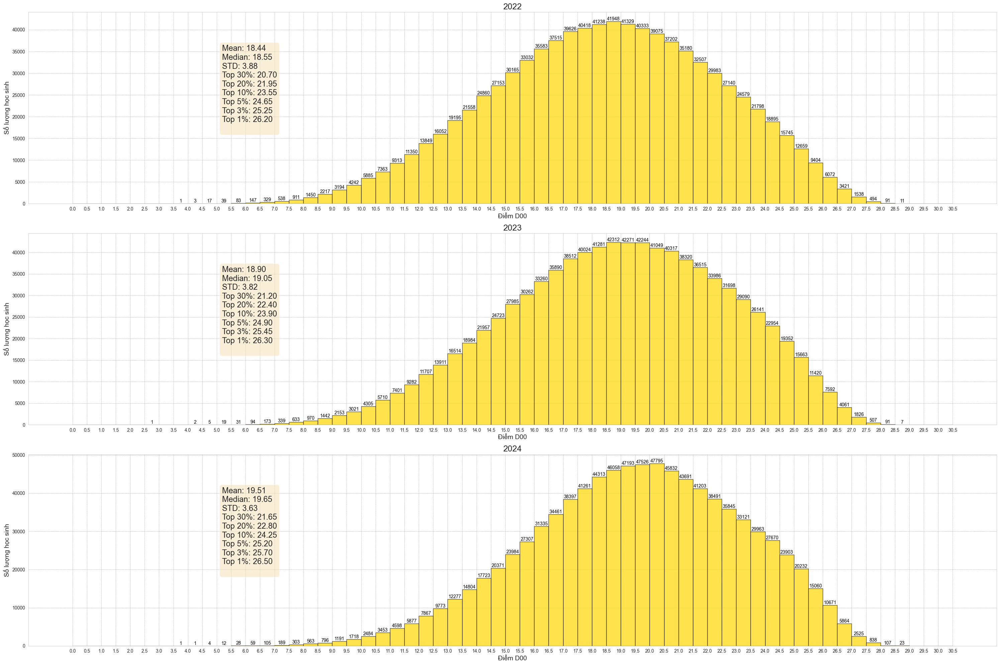

In [18]:
stats_2022 = df_2022['d00'].agg(['mean', 'median', 'var'])
stats_2023 = df_2023['d00'].agg(['mean', 'median', 'var'])
stats_2024 = df_2024['d00'].agg(['mean', 'median', 'var'])
percentiles_2022 = df_2022['d00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2023 = df_2023['d00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
percentiles_2024 = df_2024['d00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# bar charts using matplotlib:
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
statistics = [stats_2022, stats_2023, stats_2024]
percentiles_list = [percentiles_2022, percentiles_2023, percentiles_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, year in enumerate(years):
    df = data_frames[i]
    stats = statistics[i]
    percentiles = percentiles_list[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # plot distribution
    n, bins, patches = ax.hist(df['d00'], bins=np.arange(0, 31, 0.5), edgecolor='black', alpha=0.7, color='gold')
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Điểm D00', fontsize=14)
    ax.set_ylabel('Số lượng học sinh', fontsize=14)
    ax.set_xticks(np.arange(0, 31, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # num of students on bars
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}', 
                    ha='center', va='bottom', fontsize=10, color='black')

    # legend
    textstr = (
        f"Mean: {stats['mean']:.2f}\n"
        f"Median: {stats['median']:.2f}\n"
        f"STD: {np.sqrt(stats['var']):.2f}\n"
    )
    for pct, score in percentiles.items():
        textstr += f"Top {int((1 - pct) * 100 + 0.00001)}%: {score:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, textstr, transform=ax.transAxes, fontsize=17,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.savefig('bar_d00.png', facecolor='white')
plt.show()

# Biểu đồ đường phân bố điểm từng khối:

## Khối A00: Toán, Lý, Hóa

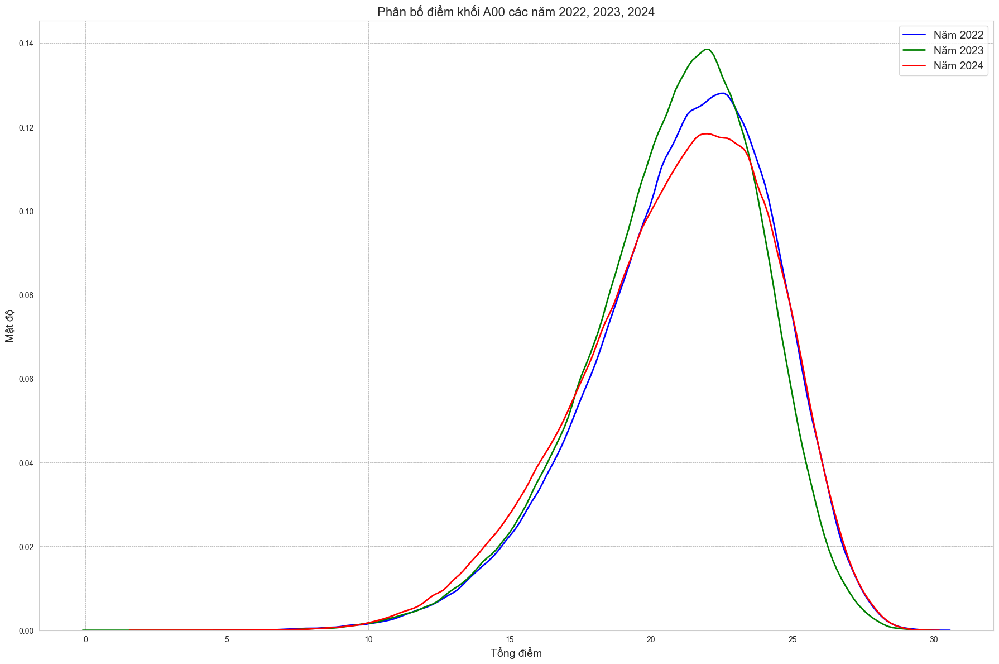

In [19]:
plt.figure(figsize=(18, 12))
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
colors = ['b', 'g', 'r']

# KDE with Seaborn 
for i, year in enumerate(years):
    df = data_frames[i]
    sns.kdeplot(df['a00'], bw_adjust=0.75, label=f'Năm {year}', color=colors[i], linewidth=2)

# legend
plt.title('Phân bố điểm khối A00 các năm 2022, 2023, 2024', fontsize=16)
plt.xlabel('Tổng điểm', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('kde_a00.png', facecolor='white')
plt.show()


## Khối A01: Toán, Lý, Anh

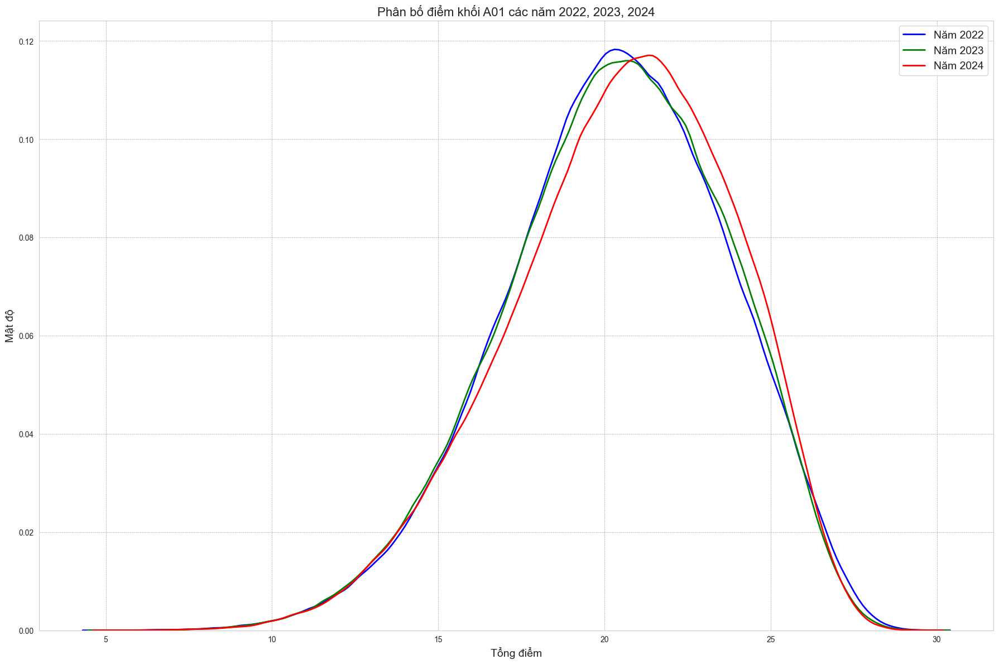

In [20]:
plt.figure(figsize=(18, 12))
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
colors = ['b', 'g', 'r']

# KDE with Seaborn 
for i, year in enumerate(years):
    df = data_frames[i]
    sns.kdeplot(df['a01'], bw_adjust=0.75, label=f'Năm {year}', color=colors[i], linewidth=2)

# legend
plt.title('Phân bố điểm khối A01 các năm 2022, 2023, 2024', fontsize=16)
plt.xlabel('Tổng điểm', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('kde_a01.png', facecolor='white')
plt.show()


## Khối B00: Toán, Hóa, Sinh

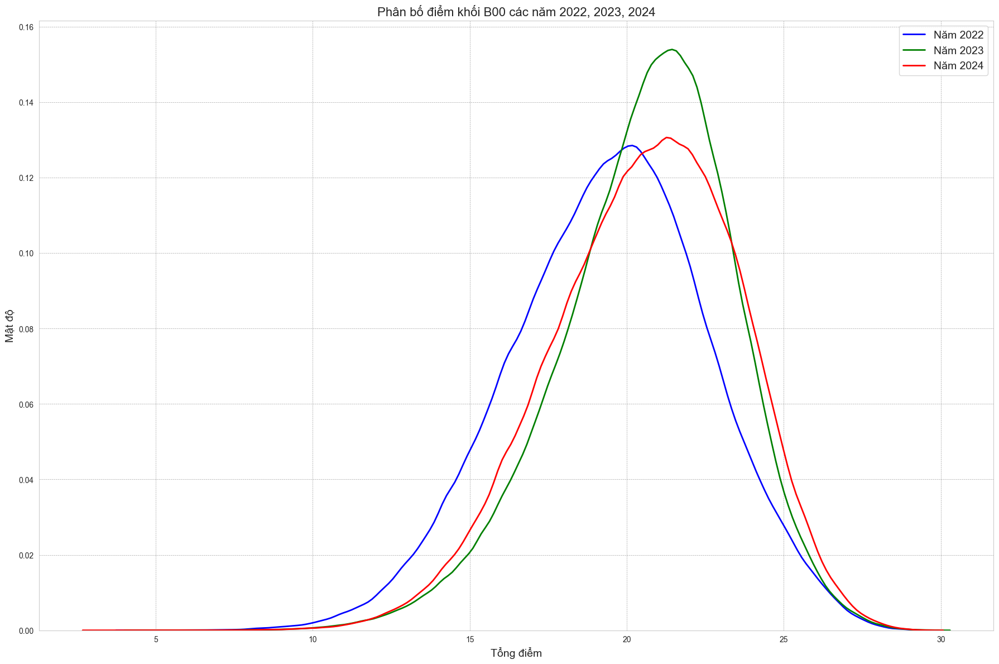

In [21]:
plt.figure(figsize=(18, 12))
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
colors = ['b', 'g', 'r']

# KDE with Seaborn 
for i, year in enumerate(years):
    df = data_frames[i]
    sns.kdeplot(df['b00'], bw_adjust=0.75, label=f'Năm {year}', color=colors[i], linewidth=2)

# legend
plt.title('Phân bố điểm khối B00 các năm 2022, 2023, 2024', fontsize=16)
plt.xlabel('Tổng điểm', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('kde_b00.png', facecolor='white')
plt.show()


## Khối C00: Văn, Sử, Địa

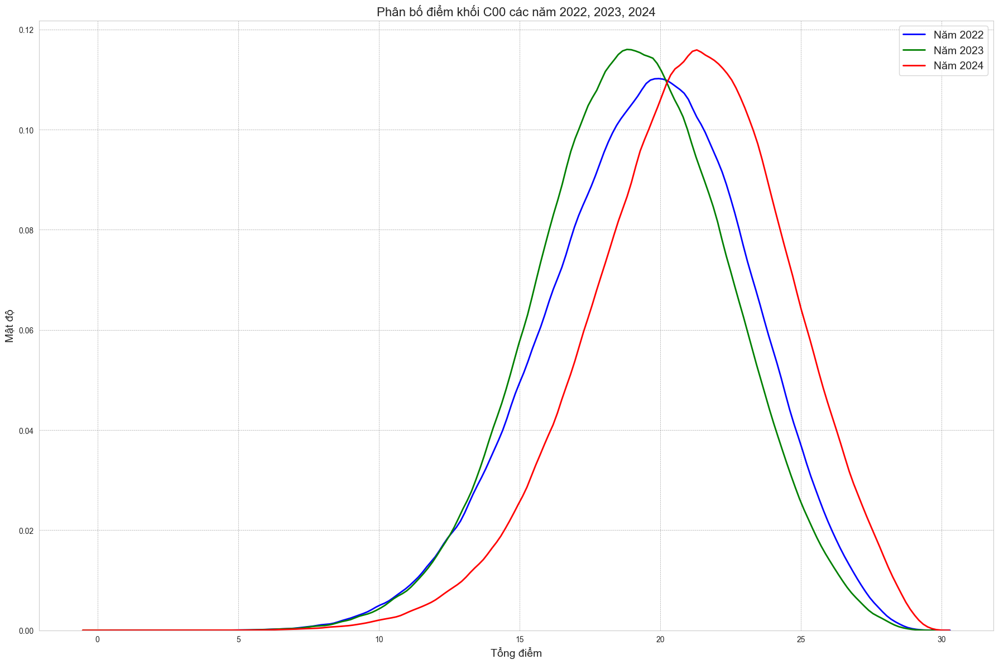

In [22]:
plt.figure(figsize=(18, 12))
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
colors = ['b', 'g', 'r']

# KDE with Seaborn 
for i, year in enumerate(years):
    df = data_frames[i]
    sns.kdeplot(df['c00'], bw_adjust=0.75, label=f'Năm {year}', color=colors[i], linewidth=2)

# legend
plt.title('Phân bố điểm khối C00 các năm 2022, 2023, 2024', fontsize=16)
plt.xlabel('Tổng điểm', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('kde_c00.png', facecolor='white')
plt.show()


## Khối D00: Toán, Văn, Anh

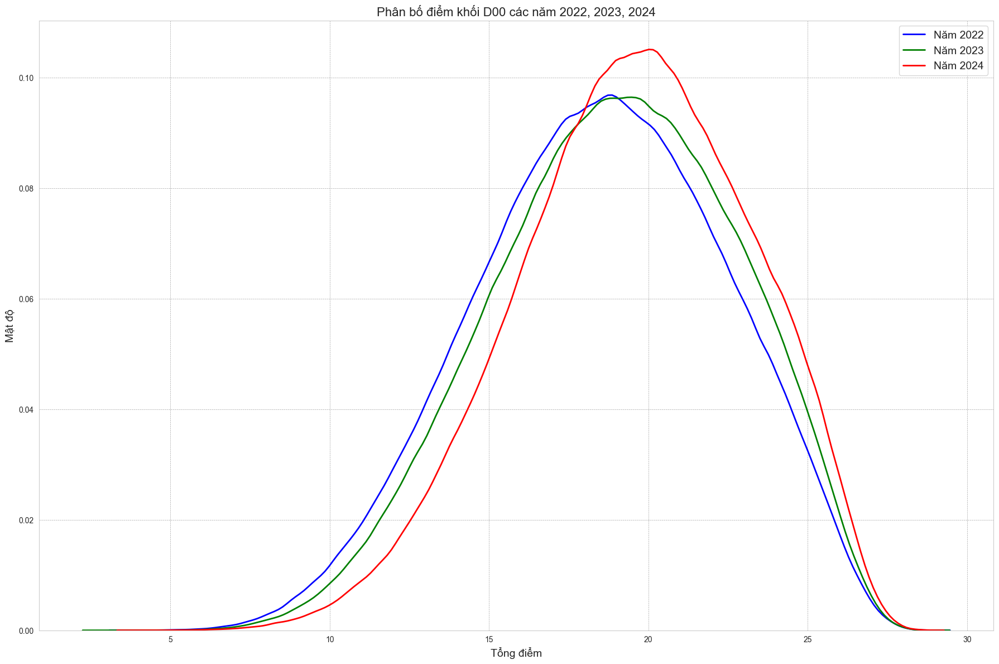

In [23]:
plt.figure(figsize=(18, 12))
years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
colors = ['b', 'g', 'r']

# KDE with Seaborn 
for i, year in enumerate(years):
    df = data_frames[i]
    sns.kdeplot(df['d00'], bw_adjust=0.75, label=f'Năm {year}', color=colors[i], linewidth=2)

# legend
plt.title('Phân bố điểm khối D00 các năm 2022, 2023, 2024', fontsize=16)
plt.xlabel('Tổng điểm', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('kde_d00.png', facecolor='white')
plt.show()


# Biểu đồ cột lồng nhau, biểu diễn số lượng thí sinh trong các khung điểm của từng khối:

## Khối A00: Toán, Lý, Hóa

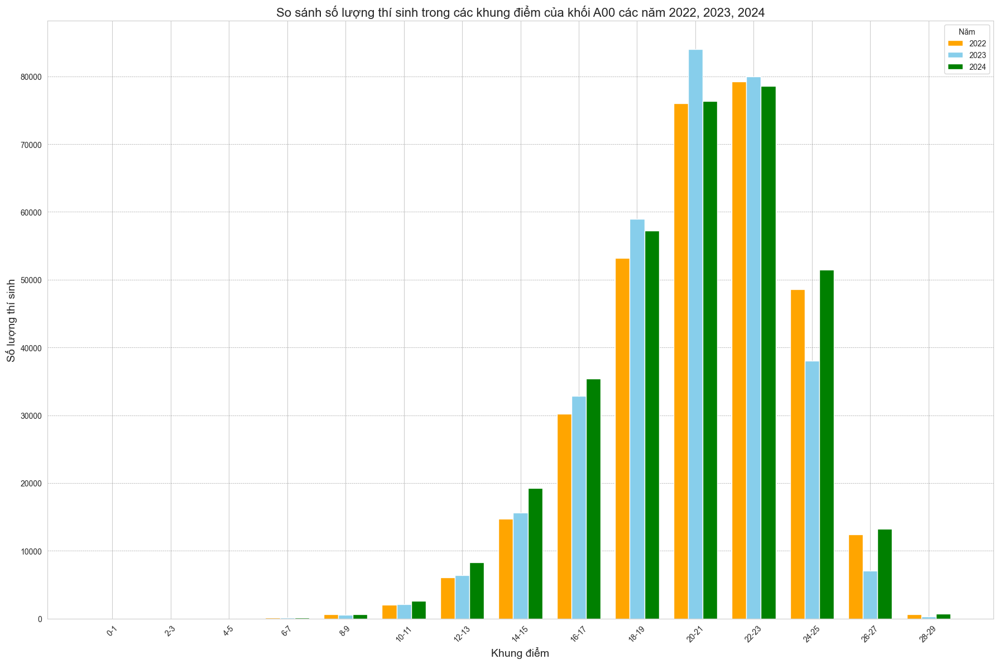

In [24]:
bins = np.arange(0, 31, 2)
score_labels = [f'{bins[i]}-{bins[i+1] - 1}' for i in range(len(bins) - 1)]

# func to calculate count per bin
def calculate_bin_counts(df, bins):
    counts, _ = np.histogram(df['a00'], bins=bins)
    return counts

bin_counts_2022 = calculate_bin_counts(df_2022, bins)
bin_counts_2023 = calculate_bin_counts(df_2023, bins)
bin_counts_2024 = calculate_bin_counts(df_2024, bins)


fig, ax = plt.subplots(figsize=(18, 12), facecolor='white')
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
x = np.arange(len(score_labels))
width = 0.25

# side by side plot
ax.bar(x - width, bin_counts_2022, width=width, label='2022', color='orange')
ax.bar(x, bin_counts_2023, width=width, label='2023', color='skyblue')
ax.bar(x + width, bin_counts_2024, width=width, label='2024', color='green')

# labeling
ax.set_xticks(x)
ax.set_xticklabels(score_labels, rotation=45)
ax.set_xlabel('Khung điểm', fontsize=14)
ax.set_ylabel('Số lượng thí sinh', fontsize=14)
ax.set_title('So sánh số lượng thí sinh trong các khung điểm của khối A00 các năm 2022, 2023, 2024', fontsize=16)
ax.legend(title='Năm')
ax.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('gbc_a00.png', facecolor='white')
plt.show()


## Khối A01: Toán, Lý, Anh

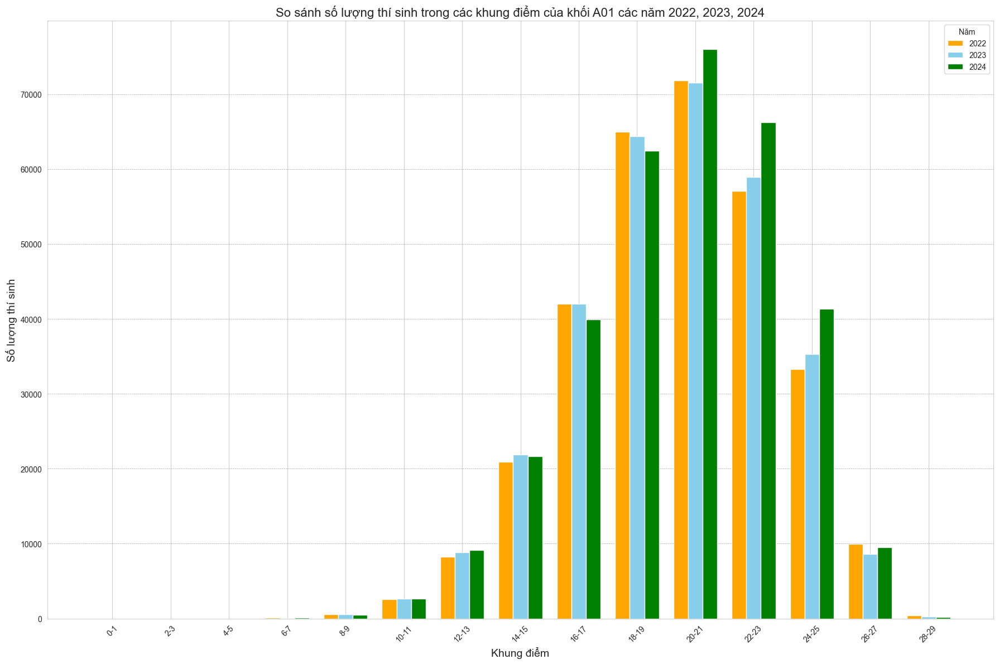

In [25]:
bins = np.arange(0, 31, 2)
score_labels = [f'{bins[i]}-{bins[i+1] - 1}' for i in range(len(bins) - 1)]

# func to calculate count per bin
def calculate_bin_counts(df, bins):
    counts, _ = np.histogram(df['a01'], bins=bins)
    return counts

bin_counts_2022 = calculate_bin_counts(df_2022, bins)
bin_counts_2023 = calculate_bin_counts(df_2023, bins)
bin_counts_2024 = calculate_bin_counts(df_2024, bins)


fig, ax = plt.subplots(figsize=(18, 12), facecolor='white')
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
x = np.arange(len(score_labels))
width = 0.25

# side by side plot
ax.bar(x - width, bin_counts_2022, width=width, label='2022', color='orange')
ax.bar(x, bin_counts_2023, width=width, label='2023', color='skyblue')
ax.bar(x + width, bin_counts_2024, width=width, label='2024', color='green')

# labeling
ax.set_xticks(x)
ax.set_xticklabels(score_labels, rotation=45)
ax.set_xlabel('Khung điểm', fontsize=14)
ax.set_ylabel('Số lượng thí sinh', fontsize=14)
ax.set_title('So sánh số lượng thí sinh trong các khung điểm của khối A01 các năm 2022, 2023, 2024', fontsize=16)
ax.legend(title='Năm')
ax.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('gbc_a01.png', facecolor='white')
plt.show()


## Khối B00: Toán, Hóa, Sinh

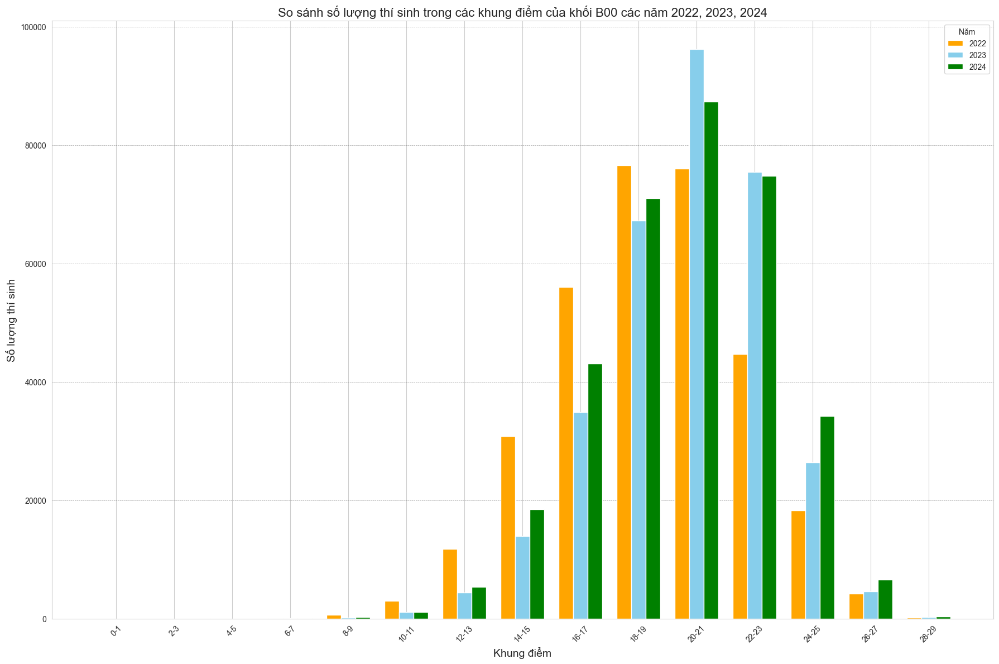

In [26]:
bins = np.arange(0, 31, 2)
score_labels = [f'{bins[i]}-{bins[i+1] - 1}' for i in range(len(bins) - 1)]

# func to calculate count per bin
def calculate_bin_counts(df, bins):
    counts, _ = np.histogram(df['b00'], bins=bins)
    return counts

bin_counts_2022 = calculate_bin_counts(df_2022, bins)
bin_counts_2023 = calculate_bin_counts(df_2023, bins)
bin_counts_2024 = calculate_bin_counts(df_2024, bins)


fig, ax = plt.subplots(figsize=(18, 12), facecolor='white')
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
x = np.arange(len(score_labels))
width = 0.25

# side by side plot
ax.bar(x - width, bin_counts_2022, width=width, label='2022', color='orange')
ax.bar(x, bin_counts_2023, width=width, label='2023', color='skyblue')
ax.bar(x + width, bin_counts_2024, width=width, label='2024', color='green')

# labeling
ax.set_xticks(x)
ax.set_xticklabels(score_labels, rotation=45)
ax.set_xlabel('Khung điểm', fontsize=14)
ax.set_ylabel('Số lượng thí sinh', fontsize=14)
ax.set_title('So sánh số lượng thí sinh trong các khung điểm của khối B00 các năm 2022, 2023, 2024', fontsize=16)
ax.legend(title='Năm')
ax.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('gbc_b00.png', facecolor='white')
plt.show()


## Khối C00: Văn, Sử, Địa

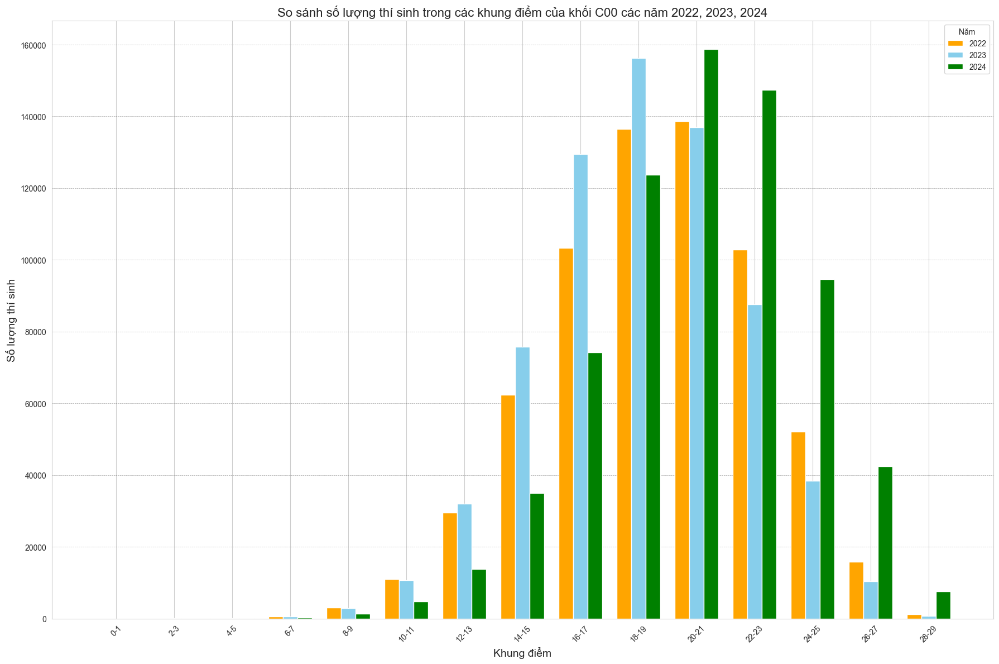

In [27]:
bins = np.arange(0, 31, 2)
score_labels = [f'{bins[i]}-{bins[i+1] - 1}' for i in range(len(bins) - 1)]

# func to calculate count per bin
def calculate_bin_counts(df, bins):
    counts, _ = np.histogram(df['c00'], bins=bins)
    return counts

bin_counts_2022 = calculate_bin_counts(df_2022, bins)
bin_counts_2023 = calculate_bin_counts(df_2023, bins)
bin_counts_2024 = calculate_bin_counts(df_2024, bins)


fig, ax = plt.subplots(figsize=(18, 12), facecolor='white')
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
x = np.arange(len(score_labels))
width = 0.25

# side by side plot
ax.bar(x - width, bin_counts_2022, width=width, label='2022', color='orange')
ax.bar(x, bin_counts_2023, width=width, label='2023', color='skyblue')
ax.bar(x + width, bin_counts_2024, width=width, label='2024', color='green')

# labeling
ax.set_xticks(x)
ax.set_xticklabels(score_labels, rotation=45)
ax.set_xlabel('Khung điểm', fontsize=14)
ax.set_ylabel('Số lượng thí sinh', fontsize=14)
ax.set_title('So sánh số lượng thí sinh trong các khung điểm của khối C00 các năm 2022, 2023, 2024', fontsize=16)
ax.legend(title='Năm')
ax.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('gbc_c00.png', facecolor='white')
plt.show()


## Khối D00: Toán, Văn, Anh

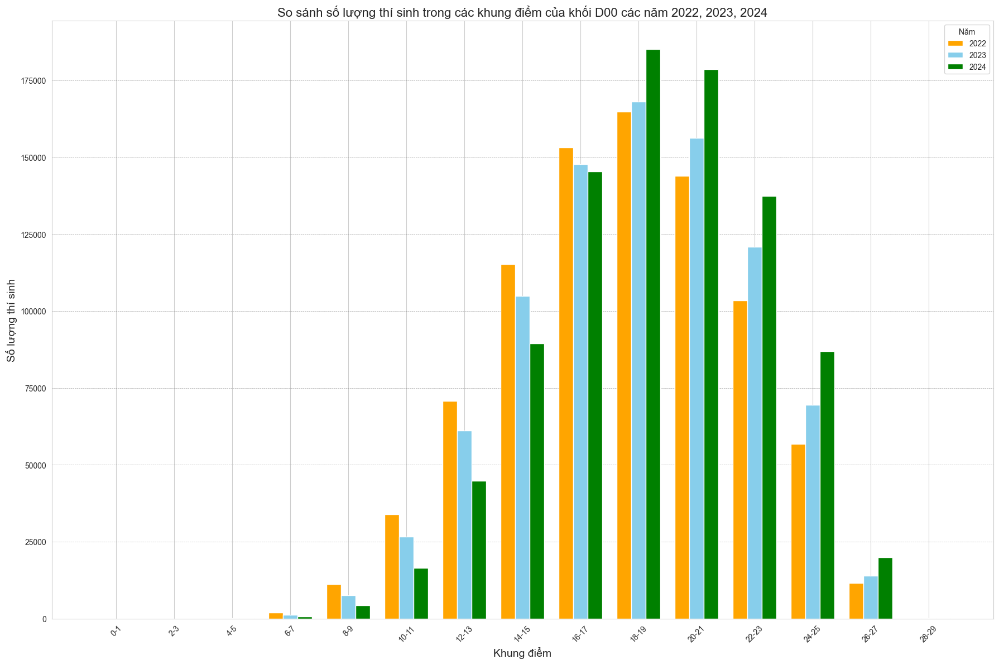

In [28]:
bins = np.arange(0, 31, 2)
score_labels = [f'{bins[i]}-{bins[i+1] - 1}' for i in range(len(bins) - 1)]

# func to calculate count per bin
def calculate_bin_counts(df, bins):
    counts, _ = np.histogram(df['d00'], bins=bins)
    return counts

bin_counts_2022 = calculate_bin_counts(df_2022, bins)
bin_counts_2023 = calculate_bin_counts(df_2023, bins)
bin_counts_2024 = calculate_bin_counts(df_2024, bins)


fig, ax = plt.subplots(figsize=(18, 12), facecolor='white')
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
x = np.arange(len(score_labels))
width = 0.25

# side by side plot
ax.bar(x - width, bin_counts_2022, width=width, label='2022', color='orange')
ax.bar(x, bin_counts_2023, width=width, label='2023', color='skyblue')
ax.bar(x + width, bin_counts_2024, width=width, label='2024', color='green')

# labeling
ax.set_xticks(x)
ax.set_xticklabels(score_labels, rotation=45)
ax.set_xlabel('Khung điểm', fontsize=14)
ax.set_ylabel('Số lượng thí sinh', fontsize=14)
ax.set_title('So sánh số lượng thí sinh trong các khung điểm của khối D00 các năm 2022, 2023, 2024', fontsize=16)
ax.legend(title='Năm')
ax.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

plt.tight_layout()
plt.savefig('gbc_d00.png', facecolor='white')
plt.show()



# Correlation matrix

### Thực ra thì là nhiều cái heatmap đặt cạnh nhau thôi

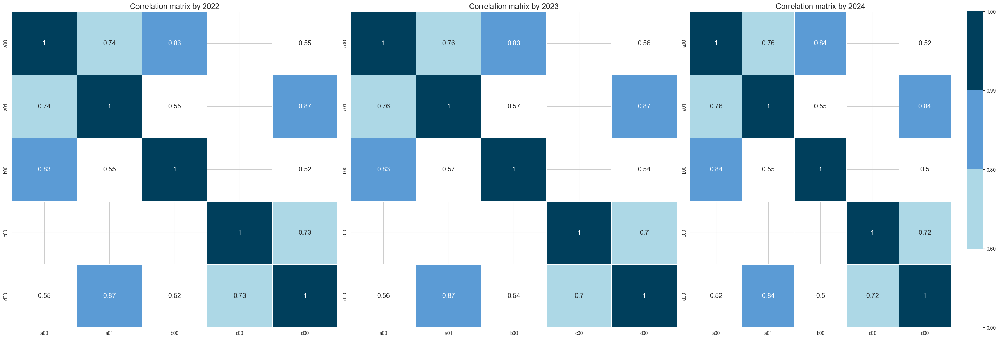

In [29]:
from matplotlib.colors import ListedColormap, BoundaryNorm

years = [2022, 2023, 2024]
data_frames = [df_2022, df_2023, df_2024]
selected_columns = ['a00', 'a01', 'b00', 'c00', 'd00']
colors = ['white', '#add8e6', '#5b9bd5', '#003f5c']  # light medium dark blues
cmap = ListedColormap(colors)
bounds = [0, 0.6, 0.8, 0.99, 1.0]
norm = BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(1, 3, figsize=(30, 10))

for i, year in enumerate(years):
    selected_df = data_frames[i][selected_columns]
    corr_matrix = selected_df.corr()
    sns.heatmap(corr_matrix, annot=True, cmap=cmap, norm=norm, ax=axes[i], cbar=(i == 2), linewidths=0.5, linecolor='white', annot_kws={"size": 14})
    axes[i].set_title(f'Correlation matrix by {year}', fontsize=16)

plt.subplots_adjust(wspace=1.5, hspace=0.75)
plt.tight_layout()
plt.savefig('CorrelationMatrix.png', facecolor='white')
plt.show()


# Điểm theo tỉnh thành Việt Nam

In [30]:
khu_vuc = {
    'Hà Nội': 'Đồng bằng sông Hồng',
    'TP. Hồ Chí Minh': 'Đông Nam Bộ',
    'Đà Nẵng': 'Duyên hải Nam Trung Bộ',
    'Cần Thơ': 'Đồng bằng sông Cửu Long',
    'Hải Phòng': 'Đồng bằng sông Hồng',
    'An Giang': 'Đồng bằng sông Cửu Long',
    'Bà Rịa - Vũng Tàu': 'Đông Nam Bộ',
    'Bắc Giang': 'Trung du và miền núi phía Bắc',
    'Bắc Kạn': 'Trung du và miền núi phía Bắc',
    'Bạc Liêu': 'Đồng bằng sông Cửu Long',
    'Bắc Ninh': 'Đồng bằng sông Hồng',
    'Bến Tre': 'Đồng bằng sông Cửu Long',
    'Bình Định': 'Duyên hải Nam Trung Bộ',
    'Bình Dương': 'Đông Nam Bộ',
    'Bình Phước': 'Đông Nam Bộ',
    'Bình Thuận': 'Duyên hải Nam Trung Bộ',
    'Cà Mau': 'Đồng bằng sông Cửu Long',
    'Cao Bằng': 'Trung du và miền núi phía Bắc',
    'Đăk Lăk': 'Tây Nguyên',
    'Đăk Nông': 'Tây Nguyên',
    'Điện Biên': 'Trung du và miền núi phía Bắc',
    'Đồng Nai': 'Đông Nam Bộ',
    'Đồng Tháp': 'Đồng bằng sông Cửu Long',
    'Gia Lai': 'Tây Nguyên',
    'Hà Giang': 'Trung du và miền núi phía Bắc',
    'Hà Nam': 'Đồng bằng sông Hồng',
    'Hải Dương': 'Đồng bằng sông Hồng',
    'Hòa Bình': 'Trung du và miền núi phía Bắc',
    'Hậu Giang': 'Đồng bằng sông Cửu Long',
    'Hưng Yên': 'Đồng bằng sông Hồng',
    'Khánh Hòa': 'Duyên hải Nam Trung Bộ',
    'Kiên Giang': 'Đồng bằng sông Cửu Long',
    'Kon Tum': 'Tây Nguyên',
    'Lai Châu': 'Trung du và miền núi phía Bắc',
    'Lâm Đồng': 'Tây Nguyên',
    'Lạng Sơn': 'Trung du và miền núi phía Bắc',
    'Lào Cai': 'Trung du và miền núi phía Bắc',
    'Long An': 'Đồng bằng sông Cửu Long',
    'Nam Định': 'Đồng bằng sông Hồng',
    'Nghệ An': 'Bắc Trung Bộ',
    'Ninh Bình': 'Đồng bằng sông Hồng',
    'Ninh Thuận': 'Duyên hải Nam Trung Bộ',
    'Phú Thọ': 'Trung du và miền núi phía Bắc',
    'Phú Yên': 'Duyên hải Nam Trung Bộ',
    'Quảng Bình': 'Bắc Trung Bộ',
    'Quảng Nam': 'Duyên hải Nam Trung Bộ',
    'Quảng Ngãi': 'Duyên hải Nam Trung Bộ',
    'Quảng Ninh': 'Đồng bằng sông Hồng',
    'Quảng Trị': 'Bắc Trung Bộ',
    'Sóc Trăng': 'Đồng bằng sông Cửu Long',
    'Sơn La': 'Trung du và miền núi phía Bắc',
    'Tây Ninh': 'Đông Nam Bộ',
    'Thái Bình': 'Đồng bằng sông Hồng',
    'Thái Nguyên': 'Trung du và miền núi phía Bắc',
    'Thanh Hóa': 'Bắc Trung Bộ',
    'Thừa Thiên Huế': 'Bắc Trung Bộ',
    'Tiền Giang': 'Đồng bằng sông Cửu Long',
    'Trà Vinh': 'Đồng bằng sông Cửu Long',
    'Tuyên Quang': 'Trung du và miền núi phía Bắc',
    'Vĩnh Long': 'Đồng bằng sông Cửu Long',
    'Vĩnh Phúc': 'Đồng bằng sông Hồng',
    'Yên Bái': 'Trung du và miền núi phía Bắc'
}

df_region = pd.DataFrame({'tinh_thanh' : khu_vuc.keys(), 'mien' : khu_vuc.values()})
print(df_region)

         tinh_thanh                           mien
0            Hà Nội            Đồng bằng sông Hồng
1   TP. Hồ Chí Minh                    Đông Nam Bộ
2           Đà Nẵng         Duyên hải Nam Trung Bộ
3           Cần Thơ        Đồng bằng sông Cửu Long
4         Hải Phòng            Đồng bằng sông Hồng
..              ...                            ...
57         Trà Vinh        Đồng bằng sông Cửu Long
58      Tuyên Quang  Trung du và miền núi phía Bắc
59        Vĩnh Long        Đồng bằng sông Cửu Long
60        Vĩnh Phúc            Đồng bằng sông Hồng
61          Yên Bái  Trung du và miền núi phía Bắc

[62 rows x 2 columns]


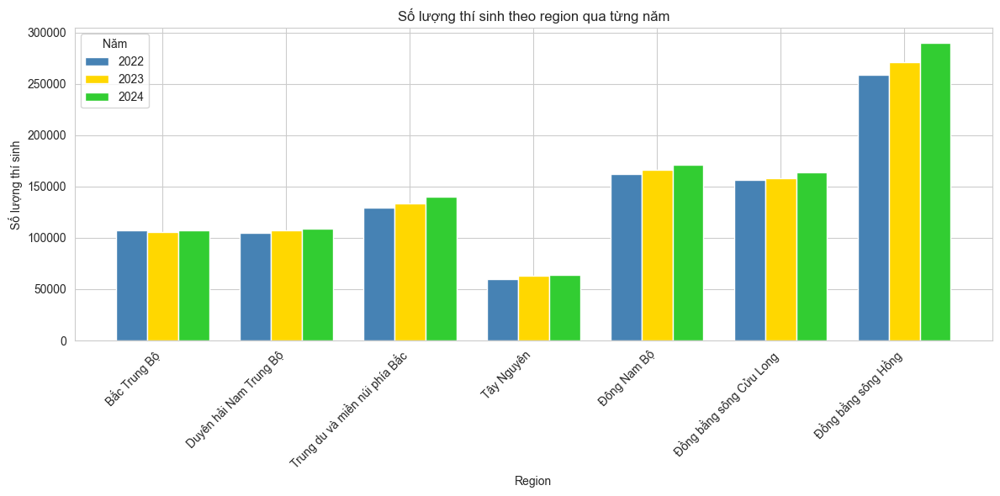

In [31]:
re_2022 = df_2022['tinh_thi'].value_counts()
re_2023 = df_2023['tinh_thi'].value_counts()
re_2024 = df_2024['tinh_thi'].value_counts()

df_re_2022 = pd.DataFrame({'tinh_thanh': re_2022.index, 'so_luong': re_2022.values})
df_re_2022 = df_re_2022.merge(df_region, on='tinh_thanh', how='inner')
df_re_2022 = df_re_2022.groupby('mien')['so_luong'].sum().reset_index()

df_re_2023 = pd.DataFrame({'tinh_thanh': re_2023.index, 'so_luong': re_2023.values})
df_re_2023 = df_re_2023.merge(df_region, on='tinh_thanh', how='inner')
df_re_2023 = df_re_2023.groupby('mien')['so_luong'].sum().reset_index()

df_re_2024 = pd.DataFrame({'tinh_thanh': re_2024.index, 'so_luong': re_2024.values})
df_re_2024 = df_re_2024.merge(df_region, on='tinh_thanh', how='inner')
df_re_2024 = df_re_2024.groupby('mien')['so_luong'].sum().reset_index()


x = np.arange(len(df_re_2024['mien']))
w = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - w, df_re_2022['so_luong'], w, label='2022', color='#4682B4')
ax.bar(x, df_re_2023['so_luong'], w, label='2023', color='#FFD700')
ax.bar(x + w, df_re_2024['so_luong'], w, label='2024', color='#32CD32')

# Add labels and title
ax.set_title("Số lượng thí sinh theo region qua từng năm")
ax.set_xlabel("Region")
ax.set_ylabel("Số lượng thí sinh")
ax.set_xticks(x)
ax.set_xticklabels(df_re_2024['mien'], rotation=45, ha='right')
ax.legend(title="Năm")

plt.tight_layout()
plt.show()


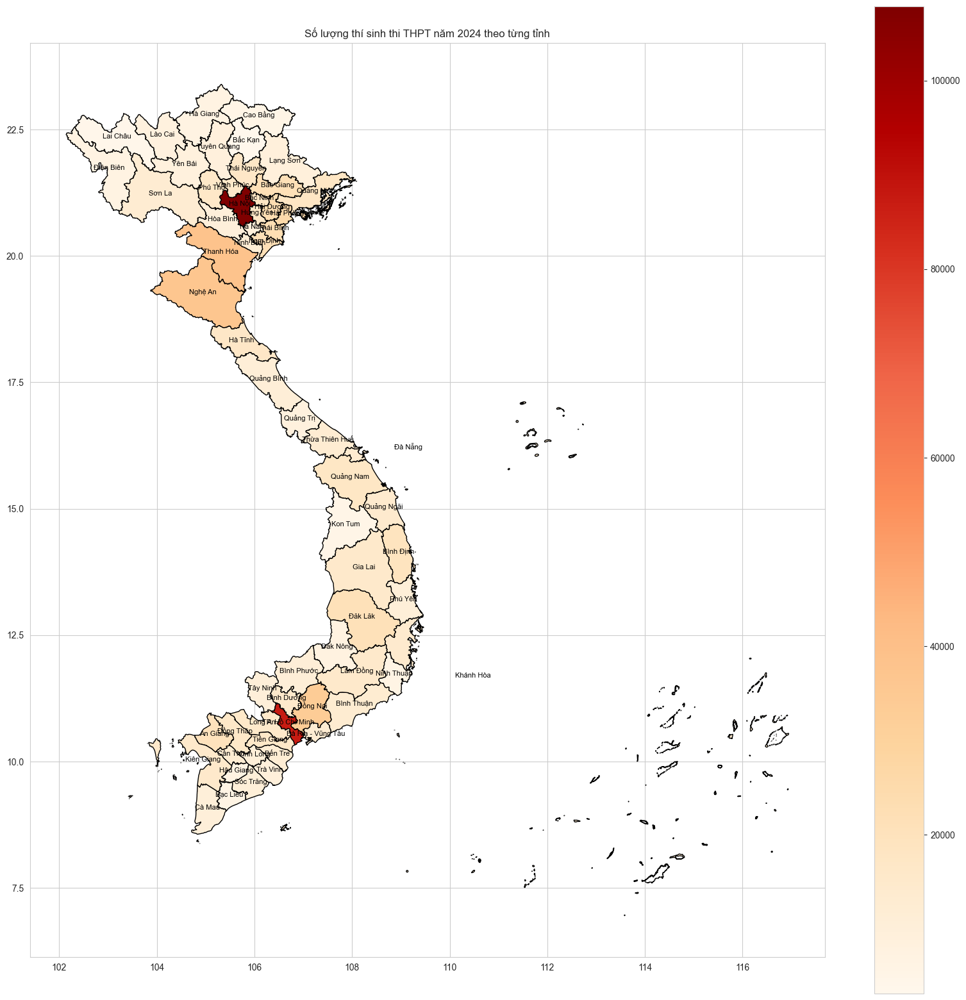

In [32]:
gdf = gpd.read_file('diaphantinh.geojson')

df_2024 = pd.read_csv('diem2024.csv')
soluong_2024 = df_2024['tinh_thi'].value_counts()

df_soluong2024 = pd.DataFrame({
    'Tỉnh thi': soluong_2024.index,
    'Số lượng': soluong_2024.values
})

g2024 = gdf.merge(df_soluong2024, left_on='ten_tinh', right_on='Tỉnh thi', how='inner')

fig, ax = plt.subplots(figsize=(20, 20))
g2024.plot(column='Số lượng', ax=ax, cmap='OrRd', edgecolor='black', legend=True)

for idx, r in gdf.iterrows():
    x, y = r['geometry'].centroid.x, r['geometry'].centroid.y
    ax.text(x, y, r['ten_tinh'], fontsize=8, ha='center', color='black')

# Tùy chỉnh
ax.set_title('Số lượng thí sinh thi THPT năm 2024 theo từng tỉnh')
plt.show()

Tổng số thí sinh thi môn toán là : 1045613


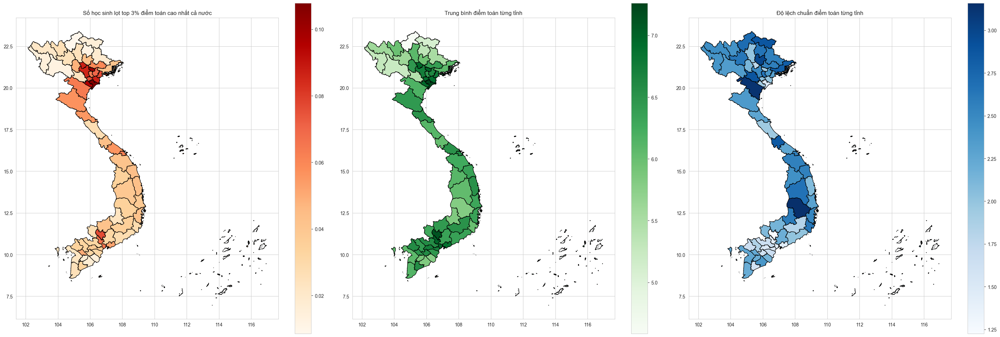

In [33]:
# ĐIỂM MÔN TOÁN Năm 2024 lọt top 3%
gdf = gpd.read_file('diaphantinh.geojson')
toan = df_2024[['toan','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn toán là : '+ str(len(toan)))

tong = toan['tinh_thi'].value_counts()
top3= toan[toan['toan'] >= toan['toan'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH TỪNG TỈNH
mean_toan = toan.groupby('tinh_thi')['toan'].mean().reset_index()
mean_toan.columns = ['Tỉnh thi', 'Trung bình điểm toán']
gdf_mean = gdf.merge(mean_toan, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN TỪNG TỈNH (VAR)
var_toan = toan.groupby('tinh_thi')['toan'].var().reset_index()
var_toan.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm toán']
gdf_var = gdf.merge(var_toan, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# Thiết lập kích thước và bố cục
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Biểu đồ 1: Top 3% điểm Toán
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm toán cao nhất cả nước')
# for idx, r in gdf.iterrows():
#     x, y = r['geometry'].centroid.x, r['geometry'].centroid.y
#     axes[0].text(x, y, r['ten_tinh'], fontsize=8, ha='center', color='black')

# Biểu đồ 2: Trung bình điểm Toán
gdf_mean.plot(
    column='Trung bình điểm toán',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm toán từng tỉnh')
# for idx, r in gdf.iterrows():
#     x, y = r['geometry'].centroid.x, r['geometry'].centroid.y
#     axes[1].text(x, y, r['ten_tinh'], fontsize=8, ha='center', color='black')

# Biểu đồ 3: Độ lệch chuẩn điểm Toán
gdf_var.plot(
    column='Độ lệch chuẩn điểm toán',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm toán từng tỉnh')
# for idx, r in gdf.iterrows():
#     x, y = r['geometry'].centroid.x, r['geometry'].centroid.y
#     axes[2].text(x, y, r['ten_tinh'], fontsize=8, ha='center', color='black')

# Tùy chỉnh và hiển thị
plt.tight_layout()
plt.show()



Tổng số thí sinh thi môn ngoại ngữ là : 912705


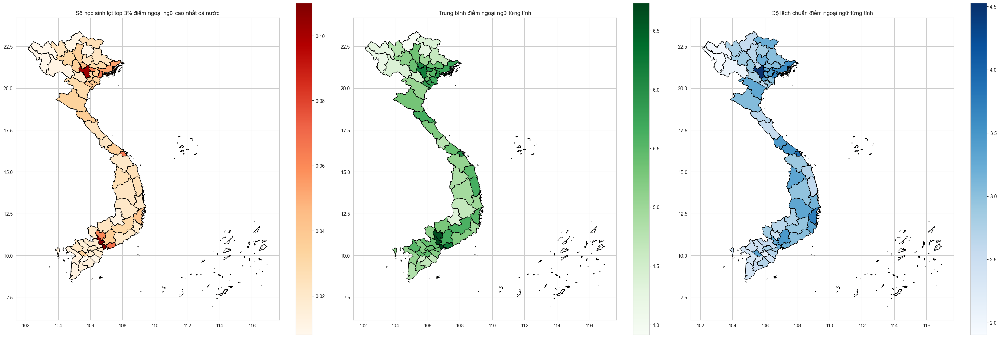

In [34]:
# ĐIỂM MÔN NGOẠI NGỮ Năm 2024 lọt top 3%
gdf = gpd.read_file('diaphantinh.geojson')
ngoai_ngu = df_2024[['ngoai_ngu','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn ngoại ngữ là : '+ str(len(ngoai_ngu)))

tong = ngoai_ngu['tinh_thi'].value_counts()
top3= ngoai_ngu[ngoai_ngu['ngoai_ngu'] >= ngoai_ngu['ngoai_ngu'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})

gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH TỪNG TỈNH
mean_ngoai_ngu = ngoai_ngu.groupby('tinh_thi')['ngoai_ngu'].mean().reset_index()
mean_ngoai_ngu.columns = ['Tỉnh thi', 'Trung bình điểm ngoại ngữ']
gdf_mean = gdf.merge(mean_ngoai_ngu, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN TỪNG TỈNH (VAR)
var_ngoai_ngu = ngoai_ngu.groupby('tinh_thi')['ngoai_ngu'].var().reset_index()
var_ngoai_ngu.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm ngoại ngữ']
gdf_var = gdf.merge(var_ngoai_ngu, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# Thiết lập kích thước và bố cục
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Biểu đồ 1: Top 3% điểm Ngoại ngữ
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm ngoại ngữ cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm Ngoại ngữ
gdf_mean.plot(
    column='Trung bình điểm ngoại ngữ',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm ngoại ngữ từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm Ngoại ngữ
gdf_var.plot(
    column='Độ lệch chuẩn điểm ngoại ngữ',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm ngoại ngữ từng tỉnh')

# Tùy chỉnh và hiển thị
plt.tight_layout()
plt.show()


Tổng số thí sinh thi A00 là: 343800


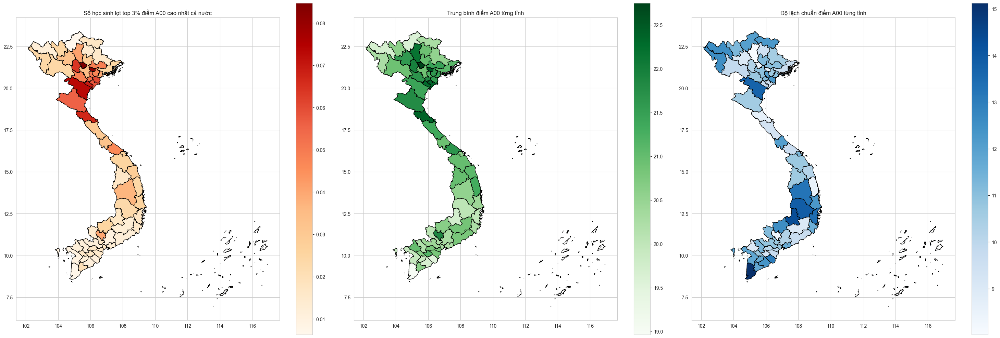

In [35]:
# LỌC DỮ LIỆU A00
a00 = df_2024[['a00', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi A00 là: ' + str(len(a00)))

# TÍNH TOP 3% ĐIỂM A00
tong = a00['tinh_thi'].value_counts()
top3 = a00[a00['a00'] >= a00['a00'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM A00 TỪNG TỈNH
mean_a00 = a00.groupby('tinh_thi')['a00'].mean().reset_index()
mean_a00.columns = ['Tỉnh thi', 'Trung bình điểm A00']
gdf_mean = gdf.merge(mean_a00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM A00 TỪNG TỈNH
var_a00 = a00.groupby('tinh_thi')['a00'].var().reset_index()
var_a00.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm A00']
gdf_var = gdf.merge(var_a00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM A00
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm A00 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM A00
gdf_mean.plot(
    column='Trung bình điểm A00',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm A00 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM A00
gdf_var.plot(
    column='Độ lệch chuẩn điểm A00',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm A00 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


Tổng số thí sinh thi A01 là: 329761


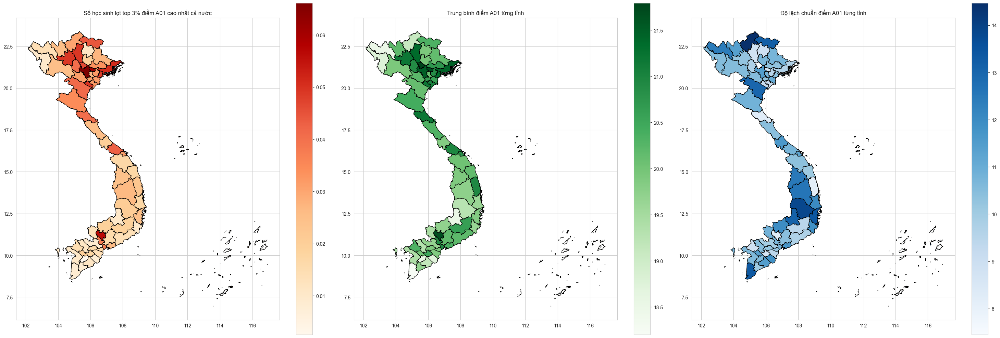

In [36]:
# LỌC DỮ LIỆU A01
a01 = df_2024[['a01', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi A01 là: ' + str(len(a01)))

# TÍNH TOP 3% ĐIỂM A01
tong = a01['tinh_thi'].value_counts()
top3 = a01[a01['a01'] >= a01['a01'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM A01 TỪNG TỈNH
mean_a01 = a01.groupby('tinh_thi')['a01'].mean().reset_index()
mean_a01.columns = ['Tỉnh thi', 'Trung bình điểm A01']
gdf_mean = gdf.merge(mean_a01, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM A01 TỪNG TỈNH
var_a01 = a01.groupby('tinh_thi')['a01'].var().reset_index()
var_a01.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm A01']
gdf_var = gdf.merge(var_a01, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM A01
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm A01 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM A01
gdf_mean.plot(
    column='Trung bình điểm A01',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm A01 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM A01
gdf_var.plot(
    column='Độ lệch chuẩn điểm A01',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm A01 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


Tổng số thí sinh thi D00 là: 908866


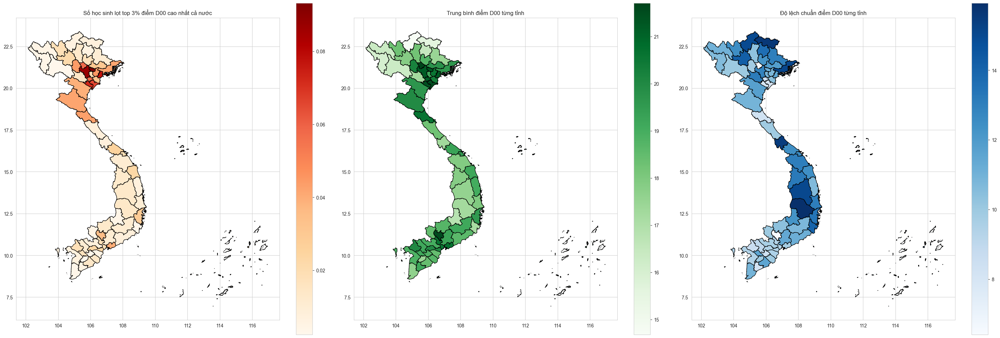

In [37]:
# LỌC DỮ LIỆU D00
d00 = df_2024[['d00', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi D00 là: ' + str(len(d00)))

# TÍNH TOP 3% ĐIỂM D00
tong = d00['tinh_thi'].value_counts()
top3 = d00[d00['d00'] >= d00['d00'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM D00 TỪNG TỈNH
mean_d00 = d00.groupby('tinh_thi')['d00'].mean().reset_index()
mean_d00.columns = ['Tỉnh thi', 'Trung bình điểm D00']
gdf_mean = gdf.merge(mean_d00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM D00 TỪNG TỈNH
var_d00 = d00.groupby('tinh_thi')['d00'].var().reset_index()
var_d00.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm D00']
gdf_var = gdf.merge(var_d00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM D00
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm D00 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM D00
gdf_mean.plot(
    column='Trung bình điểm D00',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm D00 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM D00
gdf_var.plot(
    column='Độ lệch chuẩn điểm D00',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm D00 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


In [38]:
er = df_2022[df_2022['a00'] > 30]
print(er)

Empty DataFrame
Columns: [sbd, toan, ngu_van, ngoai_ngu, vat_li, hoa_hoc, sinh_hoc, lich_su, dia_li, gdcd, a00, a01, b00, d00, c00, tinh_thi, nam_thi]
Index: []


In [12]:
''' Học sinh giỏi toán thì giỏi lý
 Chúng ta sẽ coi nếu thi điểm được >= 8 thì sẽ là giỏi => Nếu >= 70% số học sinh được >= 8 toán mà cũng được >= 8 lý thì nhận xét trên là đúng và ngược lại
Trước tiên ta sẽ tìm số lượng học sinh thi điểm toán >= 8 nhưng chỉ xét các khối thi có thi cả toán và lý
như là khối A00, A01
Sau đó từ số lượng học sinh tìm đc ở trên ta sẽ xem có bao nhiêu % học sinh đó có điểm lý >= 8 nếu tỉ lệ >= 70% ta sẽ cho nhận định là đúng
 '''

# Đọc dữ liệu
data = df_2024

# Lọc các học sinh có thi cả hai môn (Toán và Lý đều không phải NaN)
student = data.dropna(subset=['toan', 'vat_li'])

# Đếm số lượng học sinh thi cả hai môn Toán và Lý
total = len(student)

# Lọc học sinh thi cả lý và toán và có điểm toán >= 8
M = student[(student['toan'] >= 8) & (pd.notna(student['vat_li']))]
# Lọc các học sinh có điểm toán >= 8 và điểm lý >= 8
PM = student[(student['toan'] >= 8) & (student['vat_li'] >= 8)]
count_M = len(M)
count_PM = len(PM)
# Kết quả
print(f"Số lượng học sinh thi cả Toán và Lý: {total}")
print(f"Số lượng học sinh có điểm Toán >= 8 : {count_M}")
print(f"Số lượng học sinh có điểm Lí >= 8 và Toán >= 8 : {count_PM}")
rate = round((count_PM * 100/count_M),3)
print(f"Tỷ lệ học sinh điểm Lý >= 8 trong số học sinh điểm toán >= 8 là: {rate}%")
# Nếu mà trong số các học sinh có điểm toán >= 8 mà điểm lý cũng >= 8 chiếm 70% thì :
if(count_PM / count_M >= 0.7):
    print('Học sinh giỏi toán thì giỏi lý')
else:
    print('Học sinh giỏi toán thì CHƯA CHẮC ĐÃ giỏi lý')

Số lượng học sinh thi cả Toán và Lý: 345601
Số lượng học sinh có điểm Toán >= 8 : 143449
Số lượng học sinh có điểm Lí >= 8 và Toán >= 8 : 67815
Tỷ lệ học sinh điểm Lý >= 8 trong số học sinh điểm toán >= 8 là: 47.275%
Học sinh giỏi toán thì CHƯA CHẮC ĐÃ giỏi lý
